## Imports

In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import math

## Plot and Scatter fnc

In [2]:
def draw_data(ax, x, start=0, end=None, label='x', title=None, marker='o', size=1, kind='scatter'):
    """
    Scatter plot x over time in a given axis.
    
    Parameters:
        ax : matplotlib axis object
        x : numpy array to plot
        start, end : interval of indices
        label : y-axis label
        title : subplot title
        marker : style of points
        size : size of points
    """
    if end is None:
        end = len(x)
    
    if kind == 'scatter':
        ax.scatter(range(end-start), x[start:end], marker=marker, s=size)
    elif kind == 'plot':
        ax.plot(range(end-start), x[start:end])
    else:
        raise ValueError("kind doit être 'scatter' ou 'plot'")
    
    ax.set_ylabel(label)
    if title is None:
        title = f'{label} ({end-start} valeurs)'
    ax.set_title(title)
    ax.grid(True)

def draw_data1(x, start=0, end=None, label='x', title=None, marker='o', size=1, kind='plot'):
    fig, ax = plt.subplots(figsize=(15, 4))
    draw_data(ax, x, start=start, end=end, label=label, title=title, marker=marker, size=size, kind=kind)
    ax.set_xlabel('Index')
    plt.tight_layout()
    plt.show()

def draw_data2(x,y, start=0, end=None, label_x='x', label_y='y', size=1, kind='plot'):
    fig, axes = plt.subplots(2, 1, figsize=(15, 6))
    draw_data(axes[0], x, start=start, end=end, label=label_x, size=size, kind=kind)
    draw_data(axes[1], y, start=start, end=end, label=label_y, size=size, kind=kind)
    axes[1].set_xlabel('Index')
    plt.tight_layout()
    plt.show()

def draw_data3(x,y,z, start=0, end=None, label_x='x', label_y='y', label_z='z', size=1, kind='plot'):
    fig, axes = plt.subplots(3, 1, figsize=(15, 9))
    draw_data(axes[0], x, start=start, end=end, label=label_x, size=size, kind=kind)
    draw_data(axes[1], y, start=start, end=end, label=label_y, size=size, kind=kind)
    draw_data(axes[2], z, start=start, end=end, label=label_z, size=size, kind=kind)
    axes[2].set_xlabel('Index')
    plt.tight_layout()
    plt.show()

def draw_data4(w,x,y,z, start=0, end=None, label_w='w', label_x='x', label_y='y', label_z='z', size=1, kind='plot'):
    fig, axes = plt.subplots(4, 1, figsize=(15, 12))
    draw_data(axes[0], w, start=start, end=end, label=label_w, size=size, kind=kind)
    draw_data(axes[1], x, start=start, end=end, label=label_x, size=size, kind=kind)
    draw_data(axes[2], y, start=start, end=end, label=label_y, size=size, kind=kind)
    draw_data(axes[3], z, start=start, end=end, label=label_z, size=size, kind=kind)
    axes[3].set_xlabel('Index')
    plt.tight_layout()
    plt.show()

In [3]:
def compare_data(x, y, start=0, end=None, xlabel='x', ylabel='y', title=None, marker='o', size=1, kind='plot'):
    """
    Plot y versus x for a given interval.
    
    Parameters:
        x, y : numpy arrays to plot
        start : index de début (inclus)
        end : index de fin (exclus), None pour la fin du tableau
        xlabel, ylabel : labels des axes
        title : titre du graphique, None pour générer automatiquement
        marker : style des points
    """
    if end is None:
        end = len(x)

    plt.figure(figsize=(15, 10))

    if kind == 'plot':
        plt.plot(x[start:end], y[start:end], marker=marker)
    elif kind == 'scatter':
        plt.scatter(x[start:end], y[start:end], marker=marker, s=size)
    else:
        raise ValueError(f"Unknown kind: {kind}")

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    if title is None:
        title = f'{ylabel} en fonction de {xlabel} ({end-start} valeurs)'
    plt.title(title)
    
    plt.grid(True)
    plt.show()

## Derivatives and EMA

In [4]:
def compute_all_derivatives(acc_magnitude, delta_t):
    derivs = [0]  # première dérivée nulle
    for i in range(1, len(acc_magnitude)):
        deriv = (acc_magnitude[i] - acc_magnitude[i - 1]) / delta_t[i]
        derivs.append(deriv)
    return derivs

def compute_ema(values, alpha):
    ema_list = [values[0]]  # première valeur = valeur initiale
    for i in range(1, len(values)):
        ema = alpha * values[i] + (1 - alpha) * ema_list[i - 1]
        ema_list.append(ema)
    return ema_list

## Integrations

In [5]:
def trapezoidal_integration(data_x, data_y, data_z, delta_t):
    N = len(data_x)
    integrated = np.zeros((N, 3))
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

    return integrated

In [6]:
def trapezoidal_integration_with_reset(data_x, data_y, data_z, delta_t, near_ref, slow):
    N = len(data_x)
    integrated = np.zeros((N, 3))
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

        if near_ref[i] and slow[i]:
            integrated[i, 0] = 0
            integrated[i, 1] = 0
            integrated[i, 2] = 0

    return integrated

In [64]:
def trapezoidal_integration_for_velocity(data_x, data_y, data_z, delta_t, near_ref, slow):
    N = len(data_x)
    integrated = np.zeros((N, 3))

    time_in_true = 0.0
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

        cond_prev = near_ref[i-1] and slow[i-1]
        cond_now = near_ref[i] and slow[i]

        # cumule le temps où la condition reste vraie
        if cond_now:
            time_in_true += delta_t[i-1]
        else:
            time_in_true = 0.0

        # reset si transition True → False ou si condition vraie > 2s
        if (cond_prev and not cond_now) or (time_in_true > 1.0):
            integrated[i, 0] = 0
            integrated[i, 1] = 0
            integrated[i, 2] = 0
            time_in_true = 0.0

    return integrated

In [ ]:
def trapezoidal_integration_with_switching_reset(data_x, data_y, data_z, delta_t, near_ref, slow):
    N = len(data_x)
    integrated = np.zeros((N, 3))

    time_in_true = 2.0
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

        cond_prev = near_ref[i-1] and slow[i-1]
        cond_now = near_ref[i] and slow[i]

        # cumule le temps où la condition reste vraie
        if cond_now:
            time_in_true += delta_t[i-1]
            
        else:
            time_in_true = 0.0

        # reset si transition True → False ou si condition vraie > 2s
        if (cond_prev and not cond_now) or (time_in_true > 1.0):
            integrated[i, 0] = 0
            integrated[i, 1] = 0
            integrated[i, 2] = 0

    return integrated

In [71]:
def trapezoidal_integration_with_switching_reset2(data_x, data_y, data_z, delta_t, near_ref, slow):
    N = len(data_x)
    integrated = np.zeros((N, 3))

    time_in_true = 2.0
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

        cond_prev = near_ref[i-1] and slow[i-1]
        cond_now = near_ref[i] and slow[i]

        # cumule le temps où la condition reste vraie
        if cond_now:
            time_in_true += delta_t[i-1]
            integrated[i, 1] = 0
        else:
            time_in_true = 0.0

        # reset si transition True → False ou si condition vraie > 2s
        if (cond_prev and not cond_now) or (time_in_true > 1.0):
            integrated[i, 0] = 0
            integrated[i, 2] = 0

    return integrated

In [8]:
def euler_integration_with_reset(data_x, data_y, data_z, delta_t, near_ref, slow):
    """
    Integrate 3D data using simple Euler method.
    
    Parameters:
        data_x, data_y, data_z : numpy arrays of values to integrate
        delta_t : numpy array of time steps (same length as data arrays)
    
    Returns:
        integrated : numpy array of shape (N, 3) with integrated values for x, y, z
    """
    N = len(data_x)
    integrated = np.zeros((N, 3))
    
    for i in range(1, N):
        dt = delta_t[i]
        integrated[i, 0] = integrated[i-1, 0] + data_x[i-1] * dt
        integrated[i, 1] = integrated[i-1, 1] + data_y[i-1] * dt
        integrated[i, 2] = integrated[i-1, 2] + data_z[i-1] * dt

        
        if near_ref[i] and slow[i]:
            integrated[i, 0] = 0
            integrated[i, 2] = 0
    
    return integrated

In [69]:
def euler_integration_with_switching_reset(data_x, data_y, data_z, delta_t, near_ref, slow):
    """
    Integrate 3D data using simple Euler method.
    
    Parameters:
        data_x, data_y, data_z : numpy arrays of values to integrate
        delta_t : numpy array of time steps (same length as data arrays)
    
    Returns:
        integrated : numpy array of shape (N, 3) with integrated values for x, y, z
    """
    N = len(data_x)
    integrated = np.zeros((N, 3))

    time_in_true = 2.0
    
    for i in range(1, N):
        dt = delta_t[i]
        integrated[i, 0] = integrated[i-1, 0] + data_x[i-1] * dt
        integrated[i, 1] = integrated[i-1, 1] + data_y[i-1] * dt
        integrated[i, 2] = integrated[i-1, 2] + data_z[i-1] * dt


        cond_prev = near_ref[i-1] and slow[i-1]
        cond_now = near_ref[i] and slow[i]

        # cumule le temps où la condition reste vraie
        if cond_now:
            time_in_true += delta_t[i-1]
        else:
            time_in_true = 0.0

        
        if (cond_prev and not cond_now) or (time_in_true > 1.0):
            integrated[i, 0] = 0
            integrated[i, 2] = 0
    
    return integrated

## HP filters

In [10]:
import numpy as np
from scipy.signal import butter, filtfilt

def high_pass_filter_scipy(data_x, data_y, data_z, cutoff, sample_period, order=1):
    """
    Apply a high-pass Butterworth filter on 3D data.
    
    Parameters:
        data_x, data_y, data_z : numpy arrays of input data
        cutoff : cutoff frequency in Hz
        sample_period : time between samples in seconds
        order : filter order (default 1)
    
    Returns:
        filtered_x, filtered_y, filtered_z : filtered numpy arrays
    """
    fs = 1 / sample_period  # sampling frequency
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    
    filtered_x = filtfilt(b, a, data_x)
    filtered_y = filtfilt(b, a, data_y)
    filtered_z = filtfilt(b, a, data_z)
    
    return filtered_x, filtered_y, filtered_z


In [11]:
import numpy as np

def high_pass_filter_iir(x, y, z, alpha):
    """
    Simple high-pass filter for 3D data, using difference equation
    like it can be done on Nicla Sense ME.
    
    Parameters:
        x, y, z : numpy arrays of input data
        alpha : filter coefficient between 0 and 1 (smaller = plus de filtrage)
    
    Returns:
        x_hp, y_hp, z_hp : filtered arrays
    """
    x_hp = np.zeros_like(x)
    y_hp = np.zeros_like(y)
    z_hp = np.zeros_like(z)

    x_hp[0] = x[0]
    y_hp[0] = y[0]
    z_hp[0] = z[0]
    
    for i in range(1, len(x)):
        x_hp[i] = alpha * (x_hp[i-1] + x[i] - x[i-1])
        y_hp[i] = alpha * (y_hp[i-1] + y[i] - y[i-1])
        z_hp[i] = alpha * (z_hp[i-1] + z[i] - z[i-1])
    
    return x_hp, y_hp, z_hp



## LP filters

In [12]:
def low_pass_filter(x, y, z, alpha):
    N = len(x)
    ax_filtered = np.zeros(N)
    ay_filtered = np.zeros(N)
    az_filtered = np.zeros(N)

    for i in range(1, N):
        # low-pass filter on lin_acc could be added here
        alpha = 0.4
        ax_filtered[i] = alpha * x[i] + (1 - alpha) * ax_filtered[i-1]
        ay_filtered[i] = alpha * y[i] + (1 - alpha) * ay_filtered[i-1]
        az_filtered[i] = alpha * z[i] + (1 - alpha) * az_filtered[i-1]

    return ax_filtered, ay_filtered, az_filtered

# Quarternion Matrix

In [13]:

def quat_multiply(q1, q2):
    return np.array([
        q1[0]*q2[0] - q1[1]*q2[1] - q1[2]*q2[2] - q1[3]*q2[3],
        q1[0]*q2[1] + q1[1]*q2[0] + q1[2]*q2[3] - q1[3]*q2[2],
        q1[0]*q2[2] - q1[1]*q2[3] + q1[2]*q2[0] + q1[3]*q2[1],
        q1[0]*q2[3] + q1[1]*q2[2] - q1[2]*q2[1] + q1[3]*q2[0]
    ])

def cal_acc_world_quat_multo(ax, ay, az, quatw, quatx, quaty, quatz):
    N = len(ax)
    ax_world = np.zeros(N)
    ay_world = np.zeros(N)
    az_world = np.zeros(N)

    for i in range(1, N):
        # Rotate lin_acc from body frame to world frame
        q_conj = [quatw[i], -quatx[i], -quaty[i], -quatz[i]]
        q = [quatw[i], quatx[i], quaty[i], quatz[i]]
        ax_world[i], ay_world[i], az_world[i] = quat_multiply(
            quat_multiply(q, [0, ax[i], ay[i], az[i]]), 
            q_conj
        )[1:]
    
    return ax_world, ay_world, az_world

def position_from_quat_and_acc(ax, ay, az, qw, qx, qy, qz, delta_t, near_ref, slow):
    
    ax_filtered, ay_filtered, az_filtered = low_pass_filter(ax, ay, az, alpha=0.4) 

    ax_world, ay_world, az_world = cal_acc_world_quat_multo(ax_filtered, ay_filtered, az_filtered, qw, qx, qy, qz)

    # passé de g à m/s²
    ax_world, ay_world, az_world = ax_world * 9.81, ay_world * 9.81, az_world * 9.81

    vx, vy, vz = trapezoidal_integration_with_reset(ax_world, ay_world, az_world, delta_t, near_ref, slow).T

    px, py, pz = euler_integration_with_reset(vx, vy, vz, delta_t, near_ref, slow).T

    draw_data3(ax_world, ay_world, az_world, label_x='ax world', label_y='ay world', label_z='az world')
    draw_data3(vx, vy, vz, label_x='vx', label_y='vy', label_z='vz')
    draw_data3(px, py, pz, label_x='px', label_y='py', label_z='pz')
    compare_data(py, np.abs(px), xlabel='py', ylabel='px', kind='plot')

    return px, py, pz

# 1st datas

In [14]:
# chemin du fichier CSV
csv_path = "./data/data_5_steps.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

,delta_t,ax,ay,az,gx,gy,gz,qw,qx,qy,qz,lin_ax,lin_ay,lin_az
0,0.02,-0.95,-0.19,-0.19,0.04,0.00,1.00,0.64,-0.14,0.76,-0.0,0.01,0.01,-0.01
1,0.02,-0.95,-0.19,-0.18,0.02,0.00,0.00,0.64,-0.14,0.76,-0.0,0.01,0.00,0.00
2,0.02,-0.94,-0.19,-0.19,0.02,0.01,0.01,0.64,-0.14,0.76,-0.0,0.02,-0.00,-0.00
3,0.02,-0.94,-0.19,-0.20,0.03,0.01,0.02,0.64,-0.14,0.76,-0.0,0.02,-0.00,-0.01
4,0.02,-0.96,-0.19,-0.20,0.03,0.01,0.02,0.64,-0.14,0.76,-0.0,0.01,0.00,-0.01


In [15]:
# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
gx = df['gx'].to_numpy()
gy = df['gy'].to_numpy()
gz = df['gz'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

max = len(lin_ax)

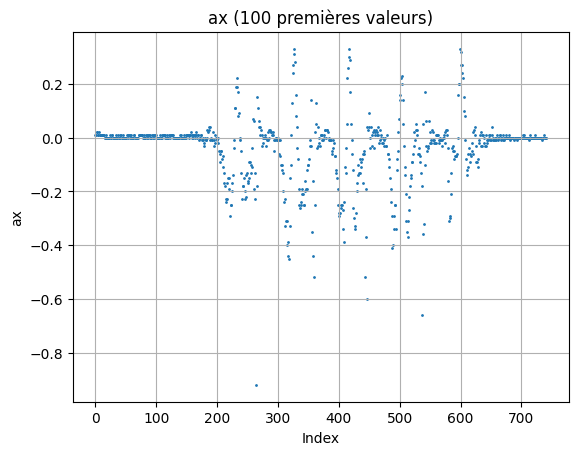

In [16]:
buffer_size = 100

plt.scatter(range(len(lin_ax)), lin_ax, marker='o', s=1)
plt.xlabel('Index')
plt.ylabel('ax')
plt.title(f'ax ({buffer_size} premières valeurs)')
plt.grid(True)
plt.show()

## Acc/lin_acc et gyr/quaternion comparasions

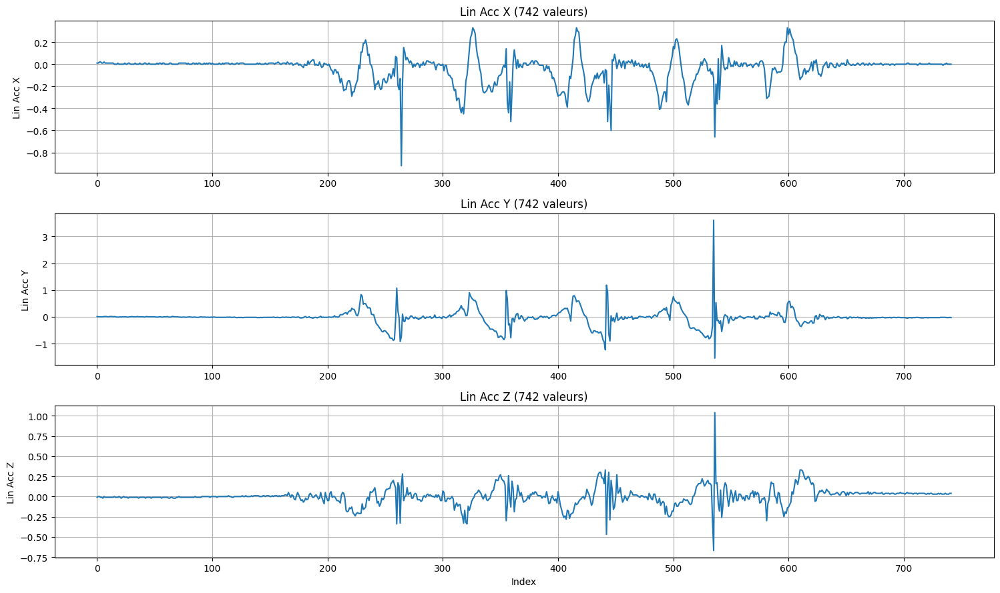

In [17]:
draw_data3(lin_ax, lin_ay, lin_az, label_x='Lin Acc X', label_y='Lin Acc Y', label_z='Lin Acc Z')

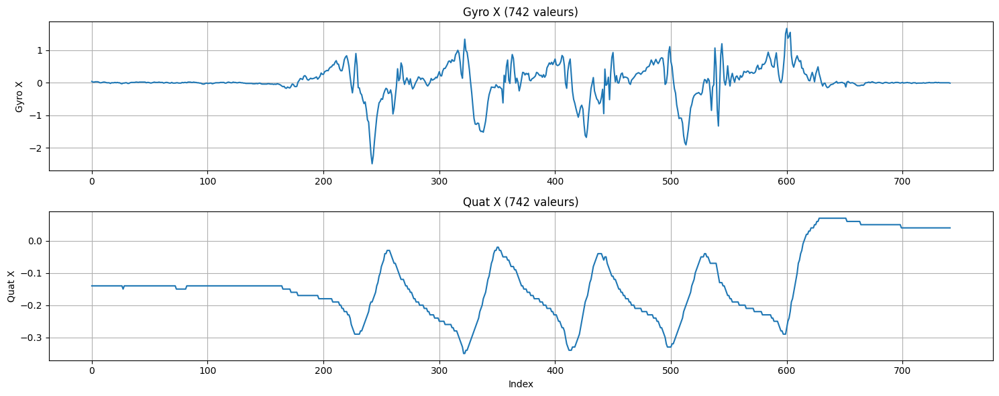

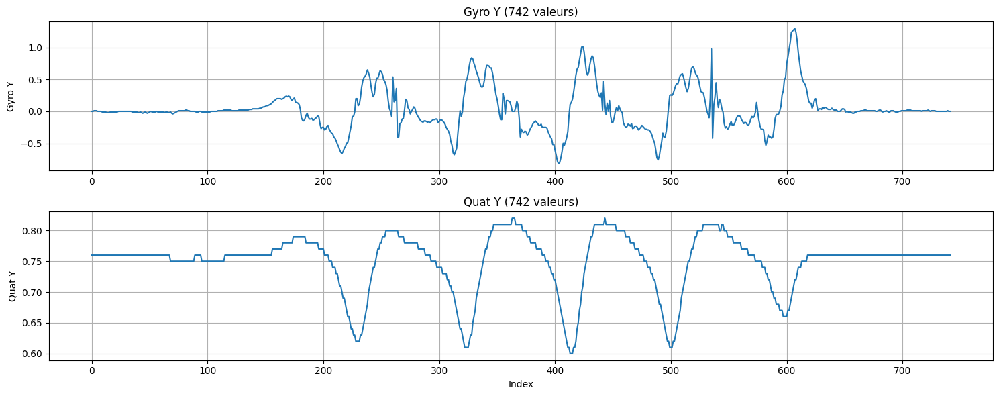

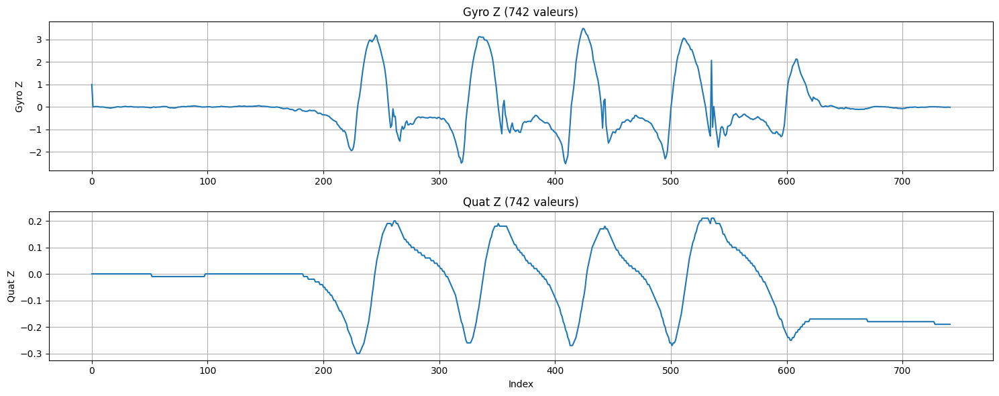

In [18]:
draw_data2(gx, qx, label_x='Gyro X', label_y='Quat X')
draw_data2(gy, qy, label_x='Gyro Y', label_y='Quat Y')
draw_data2(gz, qz, label_x='Gyro Z', label_y='Quat Z')

In [19]:
# je travaille que sur lin_acc

## Reset velocity when staing still

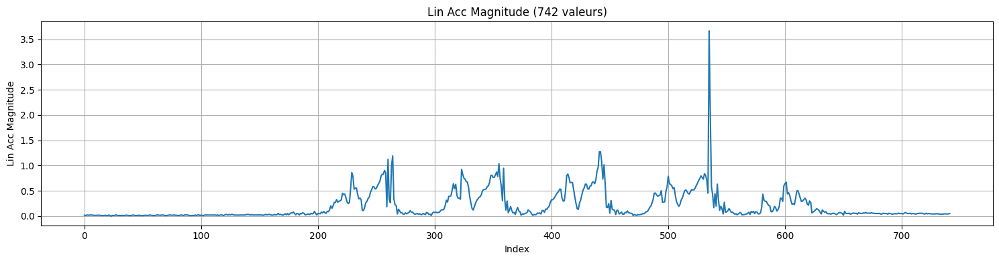

In [20]:
acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot')

In [21]:
s = 150
e = 700

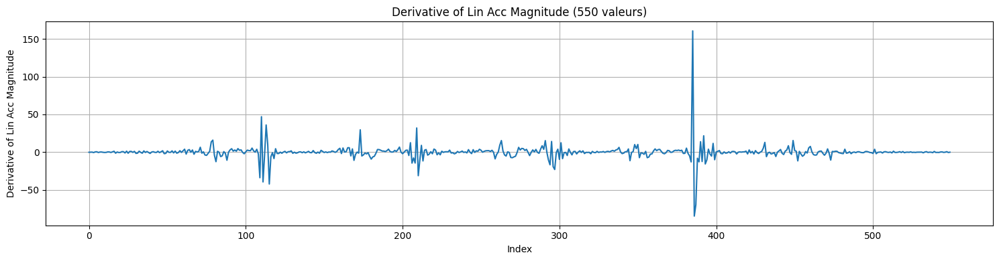

In [22]:
derivatives = compute_all_derivatives(acc_magnitude, delta_t)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=s, end=e)

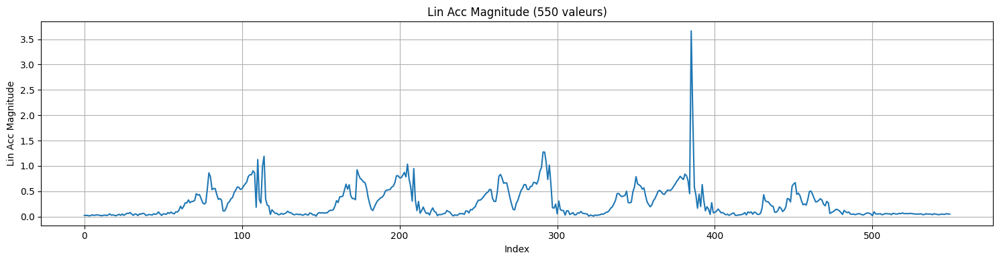

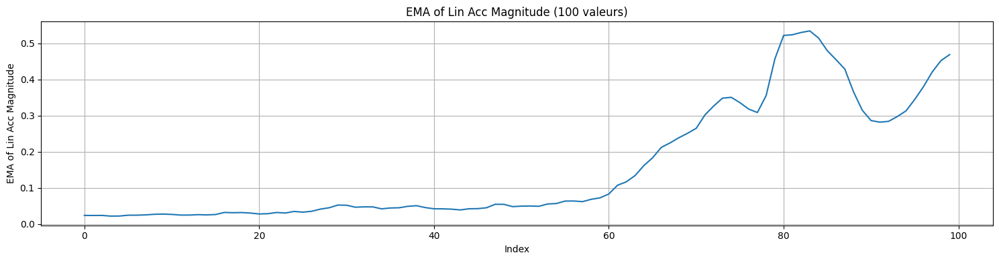

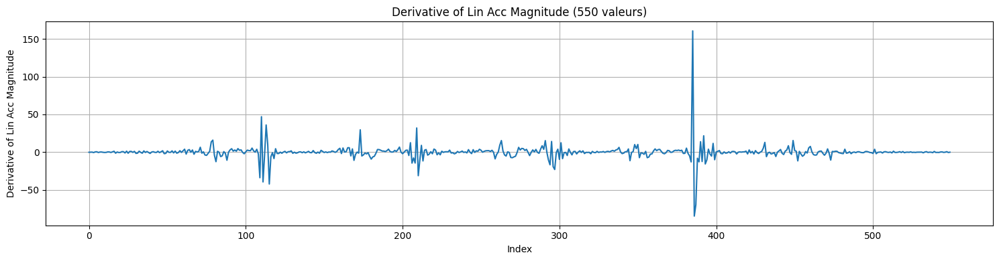

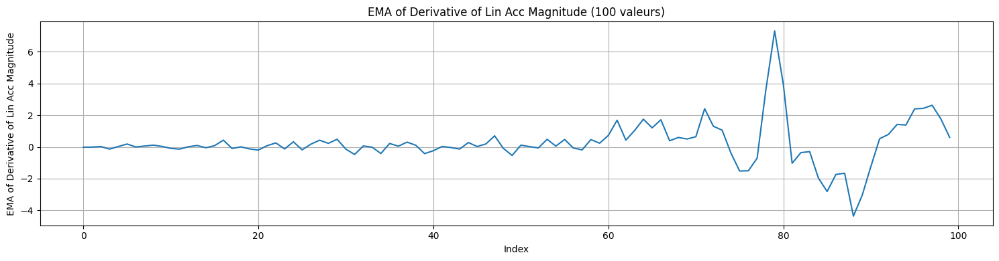

In [23]:
marges = 100 #e-s
ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=s, end=e)
draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=s, end=s+marges)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=s, end=e)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=s, end=s+marges)

In [24]:
# attention les 2 coeff ne sont pas stables, et ils necessitent des changements assez souvent. il faut donc trouver un moyen de automatiser cela.
# j'ai remarqué que il y a un rappport de 10 entre les 2 coeff assez souvent. derrCoef  = coeff * 10

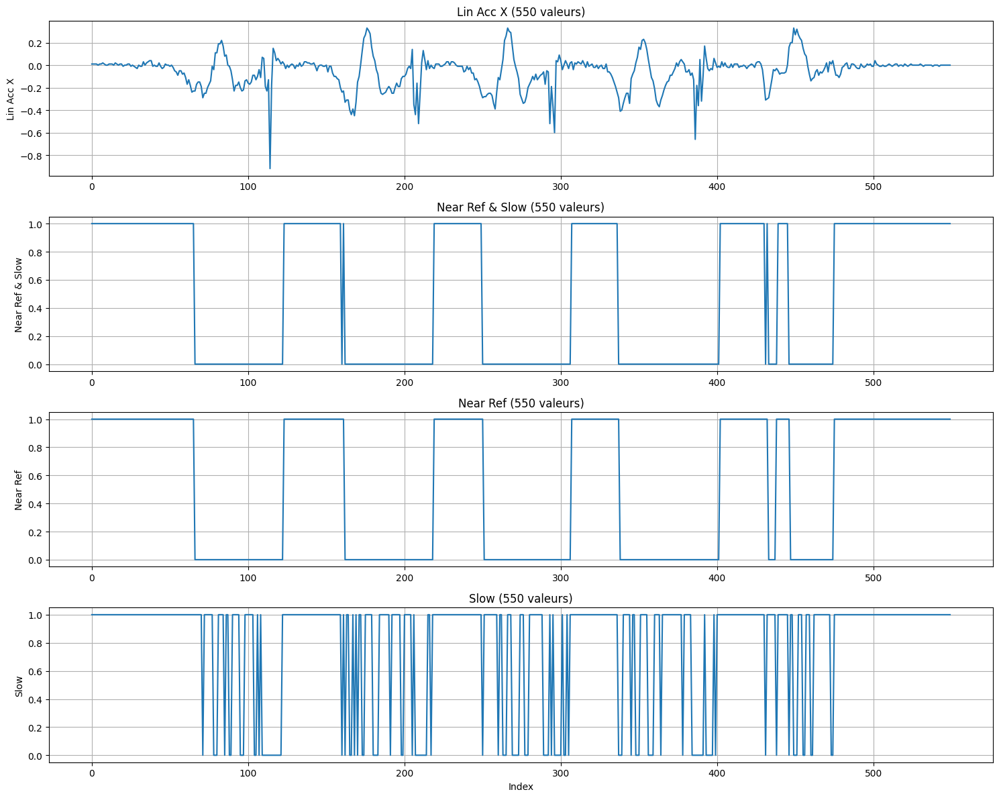

In [25]:
accMagnitudeTolerance = 0.2
derivAccMagnitudeTolerance = 2

near_ref = np.abs(ema_acc_mag) < accMagnitudeTolerance
slow = np.abs(ema_deriv) < derivAccMagnitudeTolerance


draw_data4(lin_ax, near_ref & slow, near_ref, slow, label_w='Lin Acc X', label_x='Near Ref & Slow', label_y='Near Ref', label_z='Slow', kind='plot', start=s, end=e)

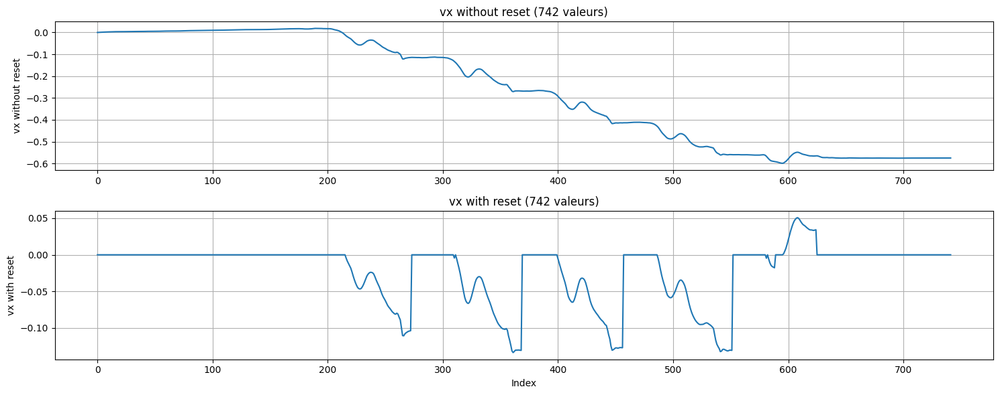

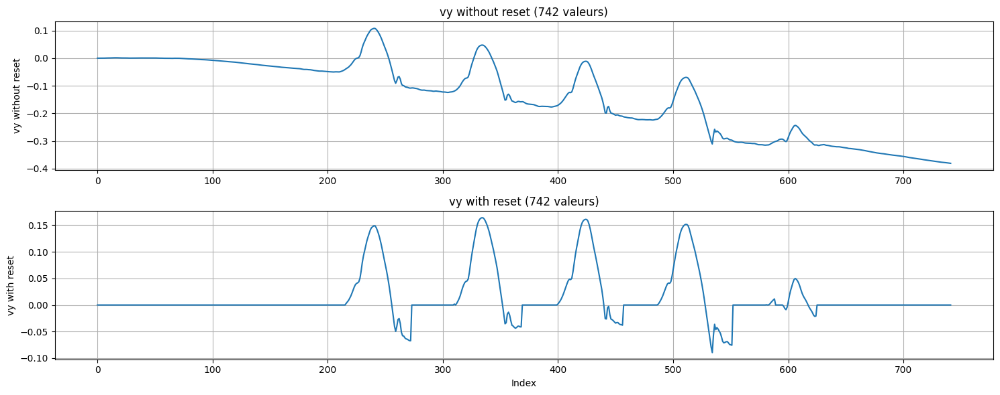

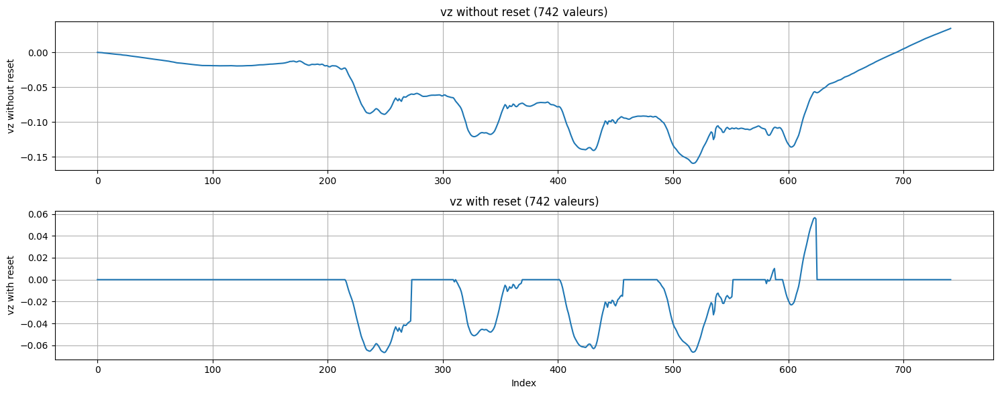

In [26]:
vx, vy, vz = trapezoidal_integration_with_reset(lin_ax, lin_ay, lin_az, delta_t, near_ref, slow).T
vx2, vy2, vz2 = trapezoidal_integration(lin_ax, lin_ay, lin_az, delta_t).T
draw_data2(vx2, vx, label_x='vx without reset', label_y='vx with reset')
draw_data2(vy2, vy, label_x='vy without reset', label_y='vy with reset')
draw_data2(vz2, vz, label_x='vz without reset', label_y='vz with reset')

## Test for différent tolerance values

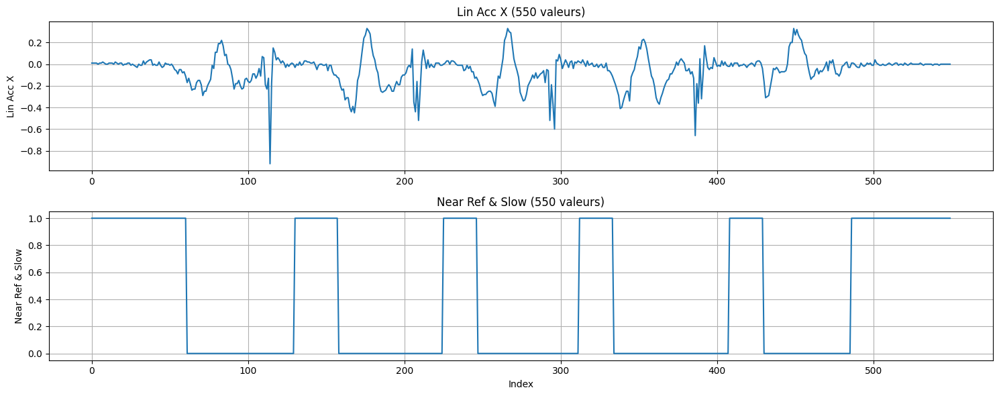

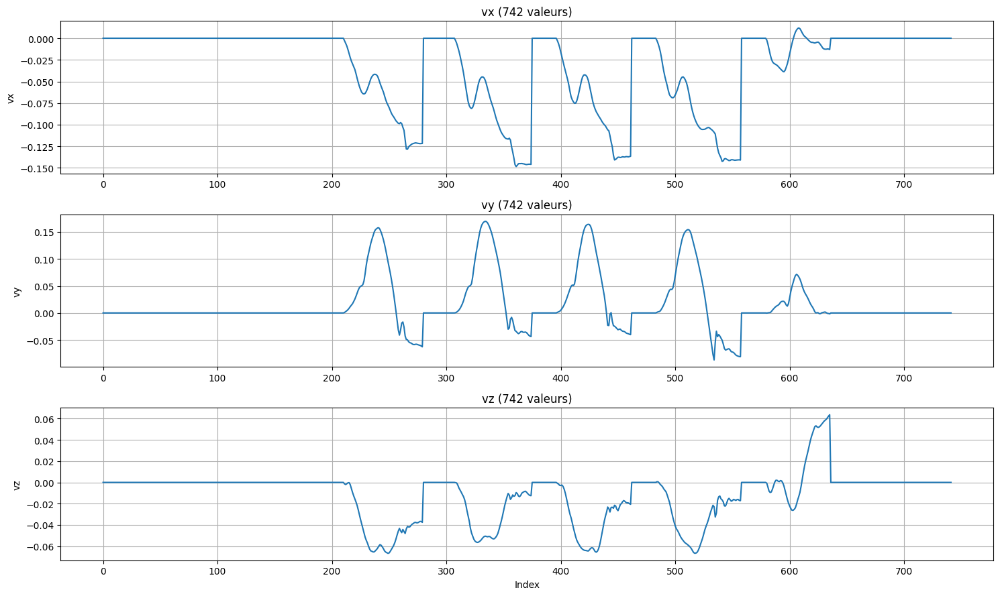

In [27]:
def test_tolerance(magTol, derivTol):

    near_ref = np.abs(ema_acc_mag) < magTol
    slow = np.abs(ema_deriv) < derivTol


    draw_data2(lin_ax, near_ref & slow, label_x='Lin Acc X', label_y='Near Ref & Slow', kind='plot', start=s, end=e)

    vx, vy, vz = trapezoidal_integration_with_reset(lin_ax, lin_ay, lin_az, delta_t, near_ref, slow).T

    draw_data3(vx, vy, vz, label_x='vx', label_y='vy', label_z='vz')

test_tolerance(0.1, 1)

## pos calculation

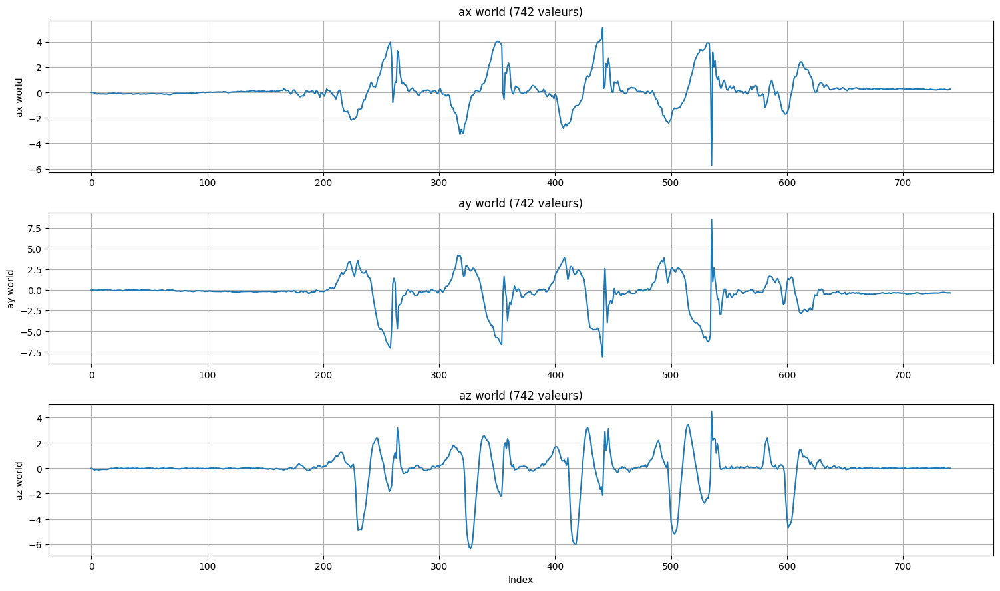

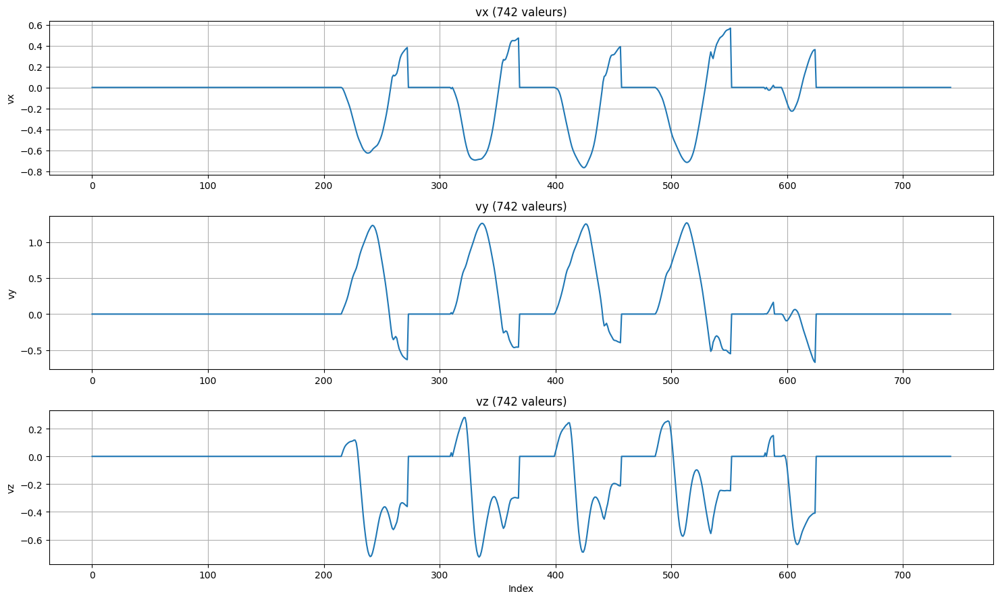

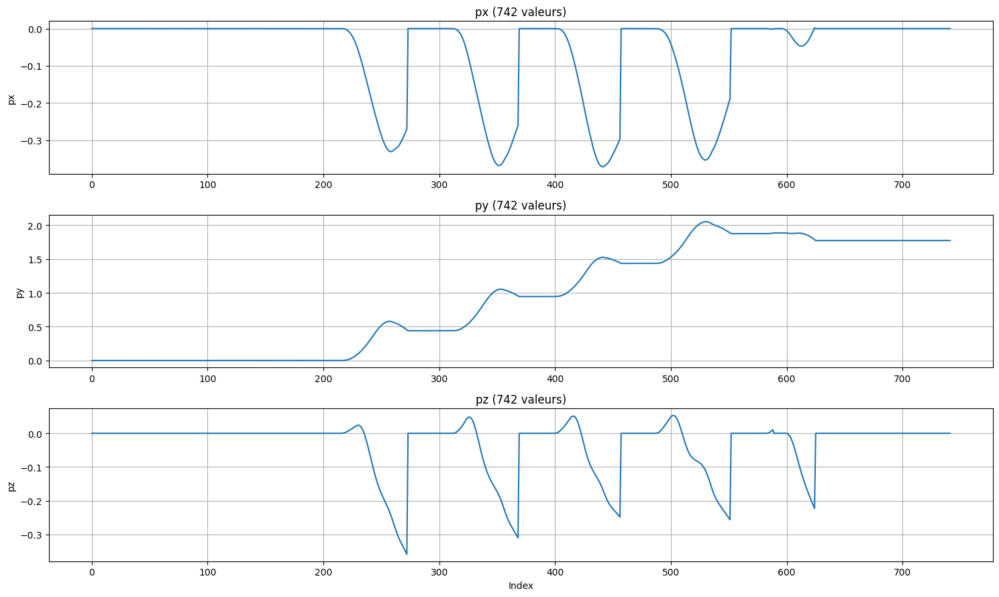

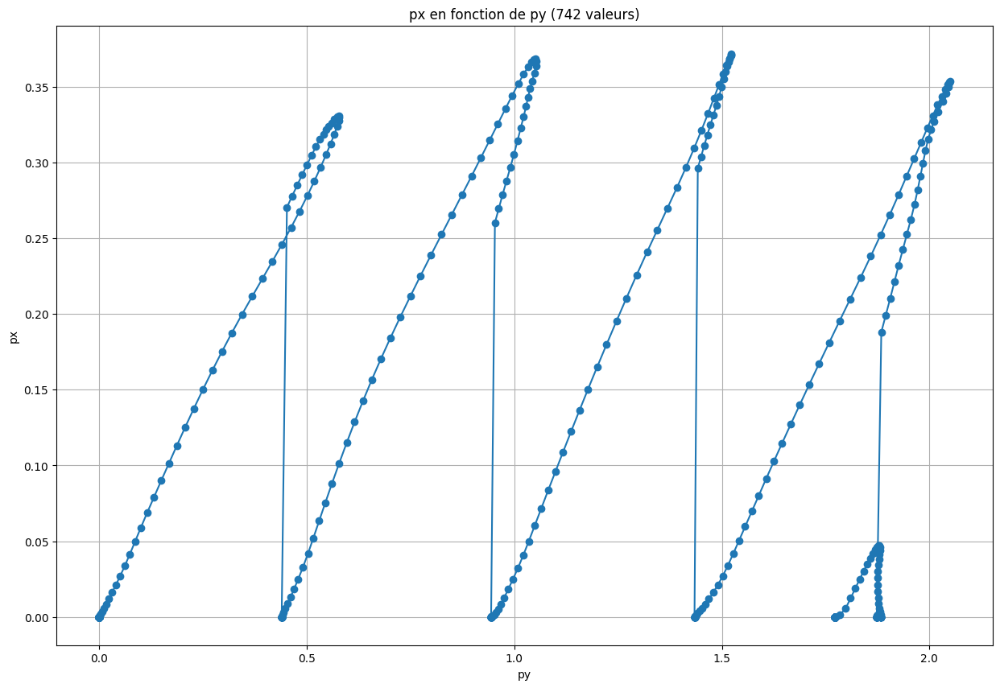

In [28]:
px, py, pz = position_from_quat_and_acc(lin_ax, lin_ay, lin_az, qw, qx, qy, qz, delta_t, near_ref, slow)

# Second datas

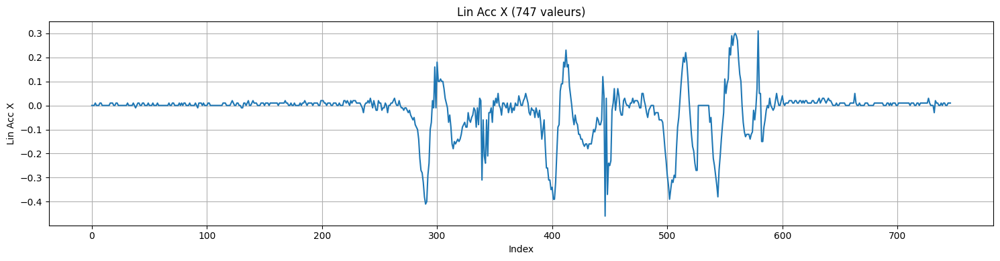

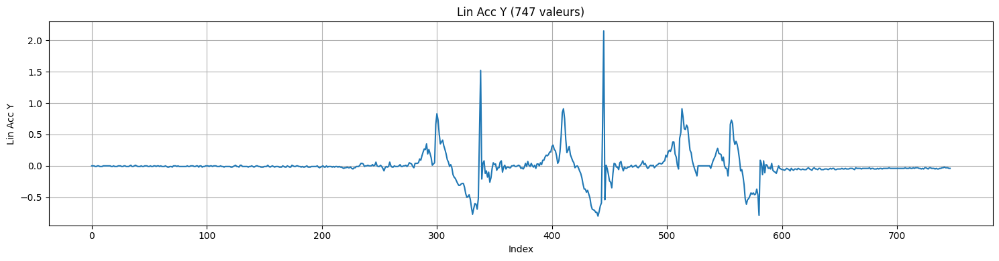

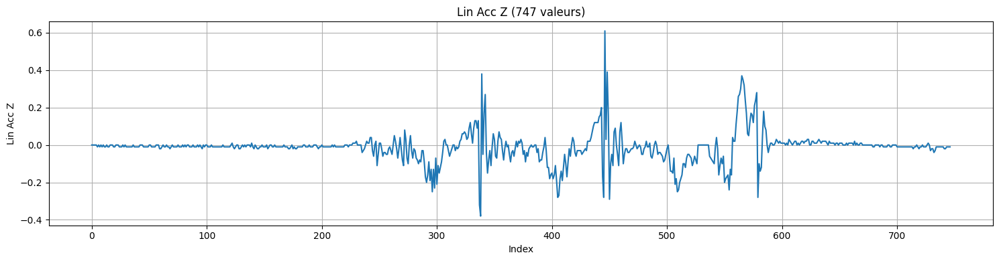

In [29]:
# chemin du fichier CSV
csv_path = "./data/data_5_steps2.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

# draw data
draw_data1(lin_ax, label='Lin Acc X', kind='plot')
draw_data1(lin_ay, label='Lin Acc Y', kind='plot')
draw_data1(lin_az, label='Lin Acc Z', kind='plot')

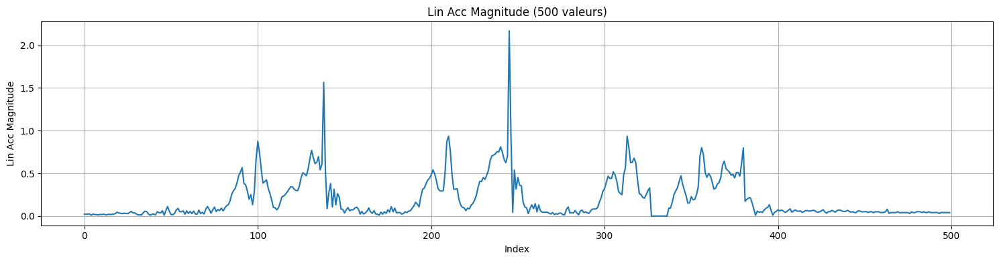

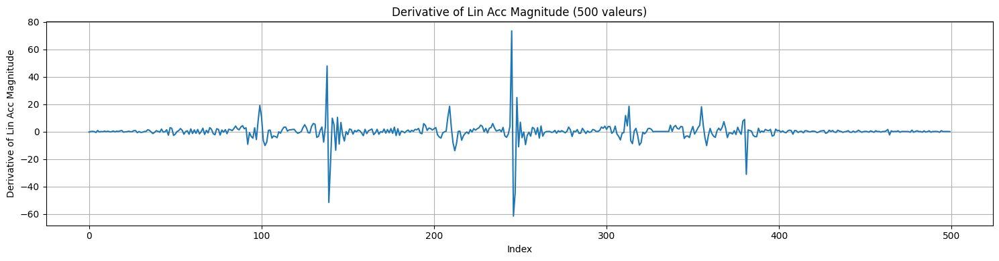

In [30]:
start = 200
end = 700

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_all_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

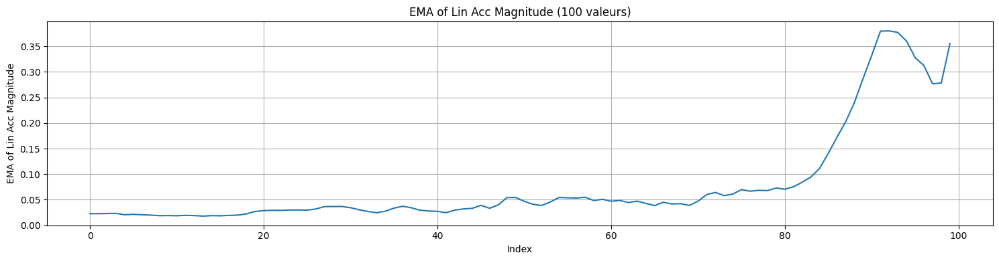

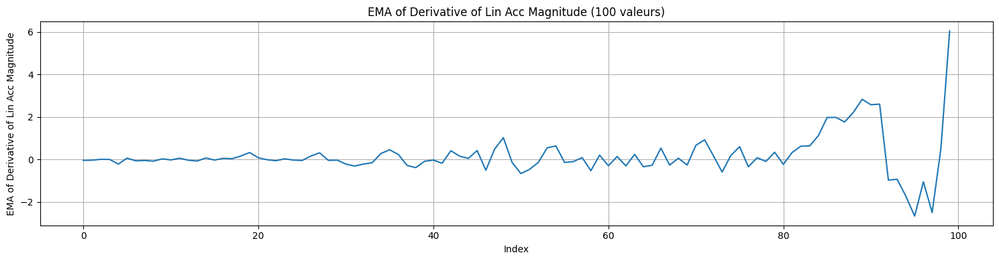

In [31]:
marge = 100

draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)

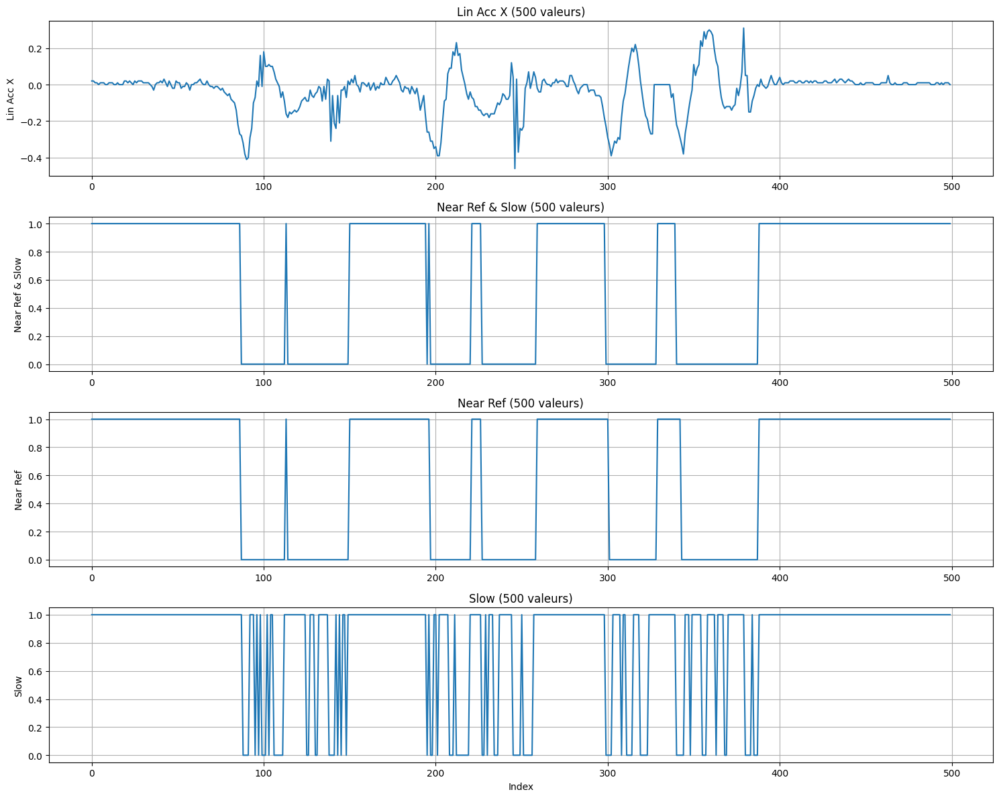

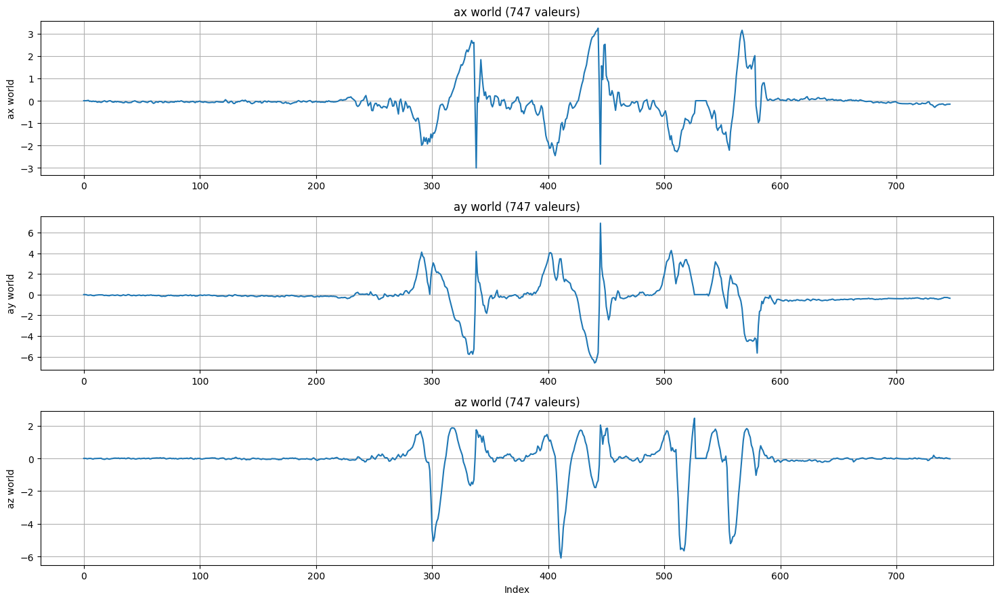

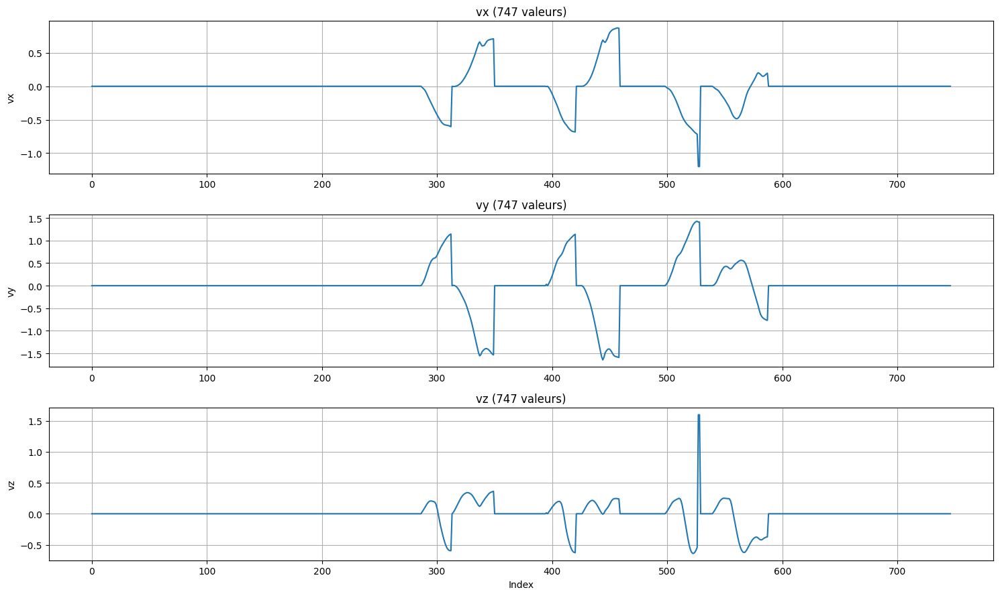

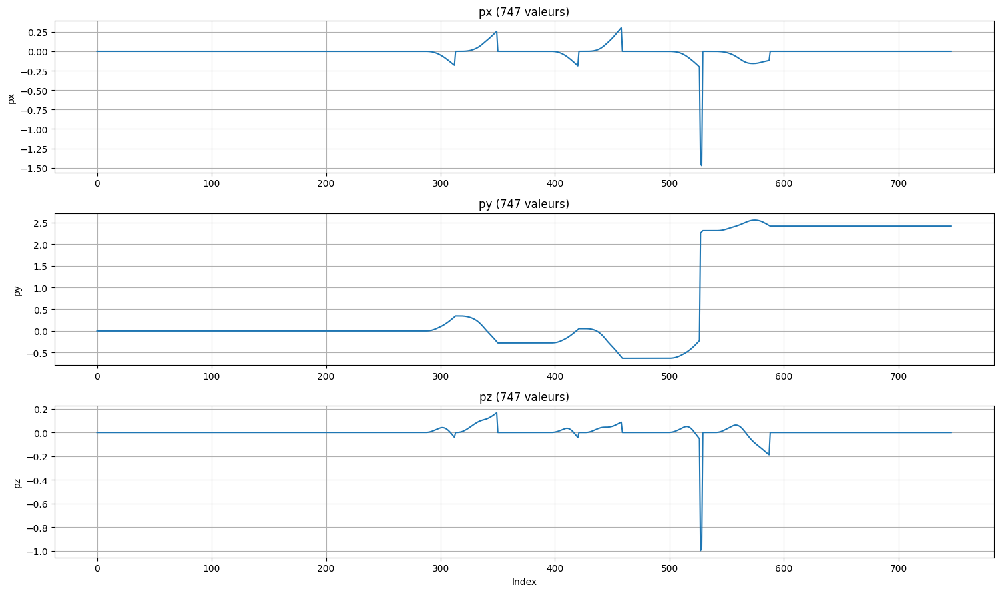

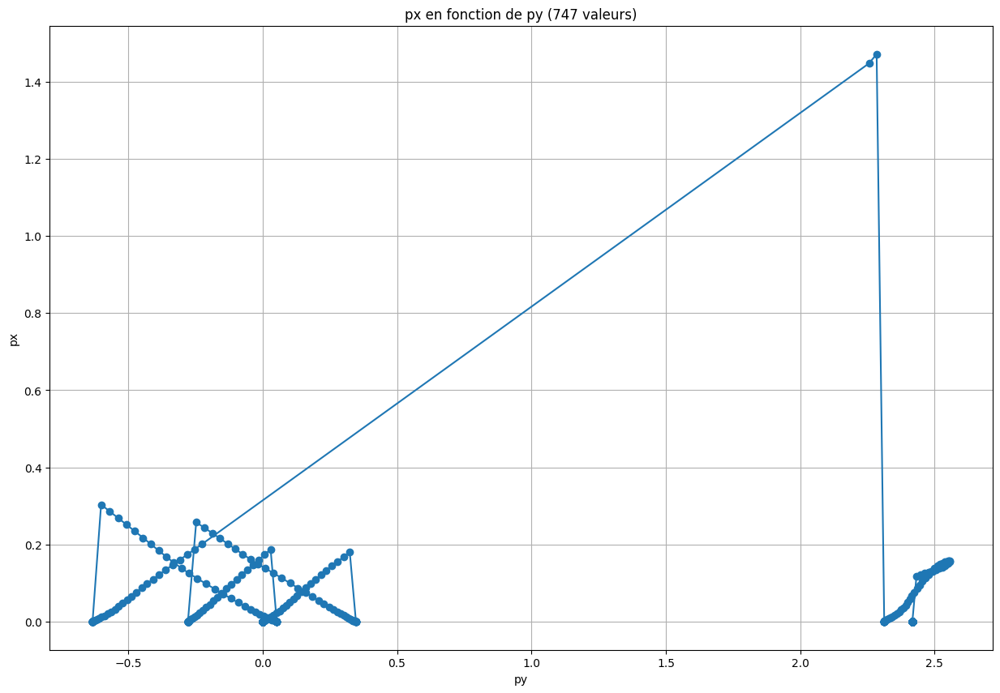

In [32]:
accMagnitudeTolerance = 0.2
derivAccMagnitudeTolerance = 2

near_ref = np.abs(ema_acc_mag) < accMagnitudeTolerance
slow = np.abs(ema_deriv) < derivAccMagnitudeTolerance

draw_data4(lin_ax, near_ref & slow, near_ref, slow, label_w='Lin Acc X', label_x='Near Ref & Slow', label_y='Near Ref', label_z='Slow', kind='plot', start=start, end=end)

px, py, pz = position_from_quat_and_acc(lin_ax, lin_ay, lin_az, qw, qx, qy, qz, delta_t, near_ref, slow)

# 3rd datas

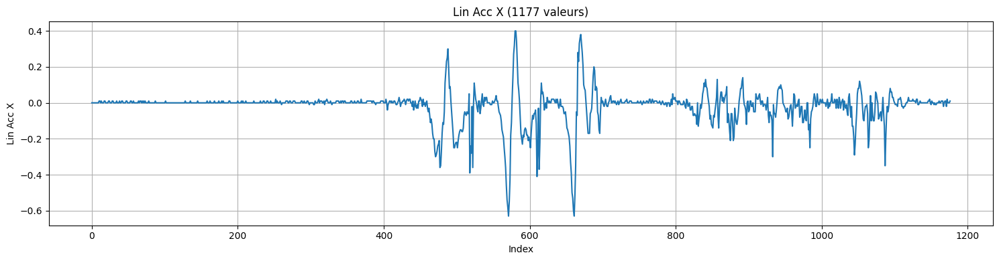

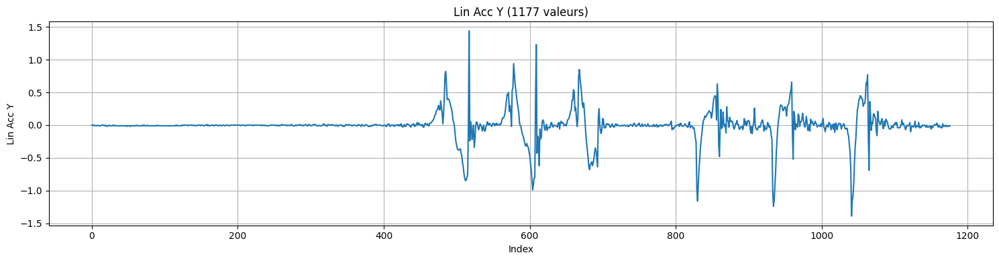

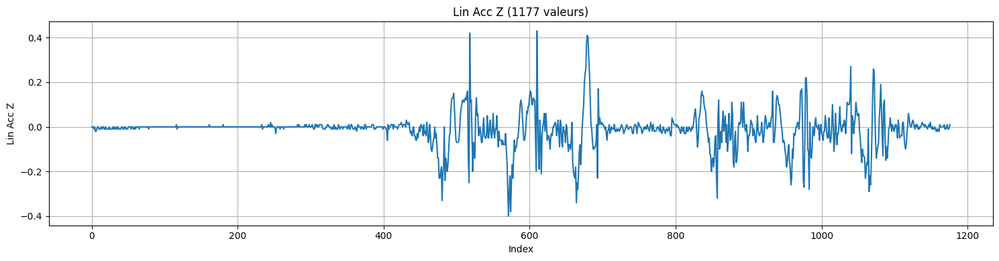

In [33]:
# chemin du fichier CSV
csv_path = "./data/data_3_steps_front_back.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

# draw data
draw_data1(lin_ax, label='Lin Acc X', kind='plot')
draw_data1(lin_ay, label='Lin Acc Y', kind='plot')
draw_data1(lin_az, label='Lin Acc Z', kind='plot')

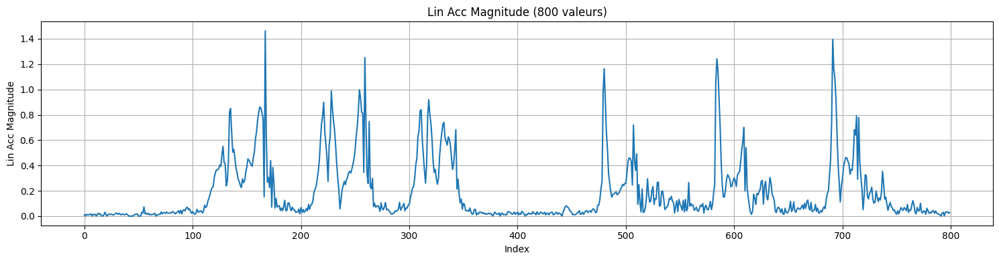

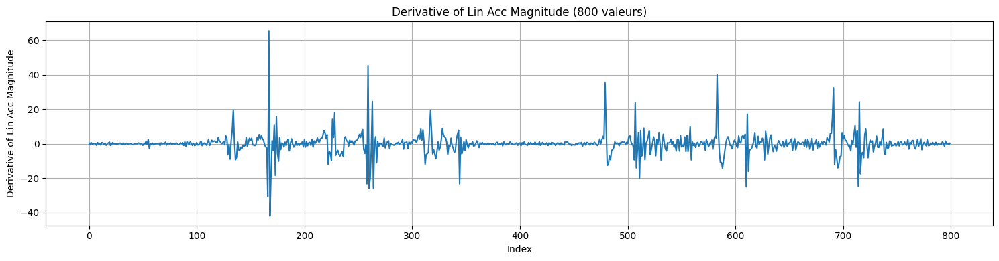

In [34]:
start = 350
end = 1150

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_all_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

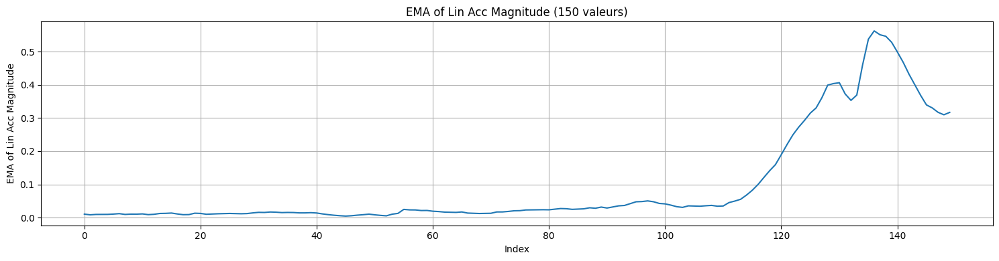

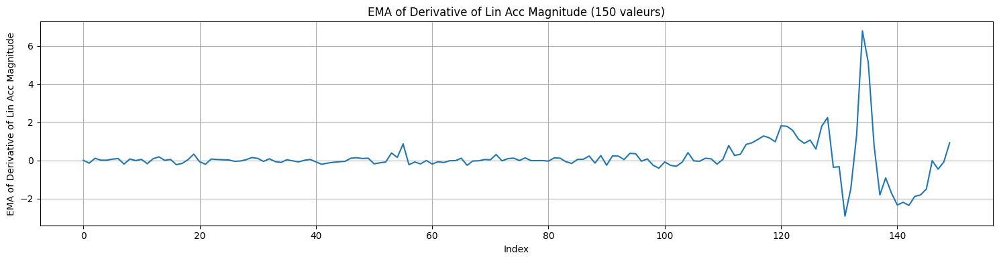

In [35]:
marge = 150

draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)

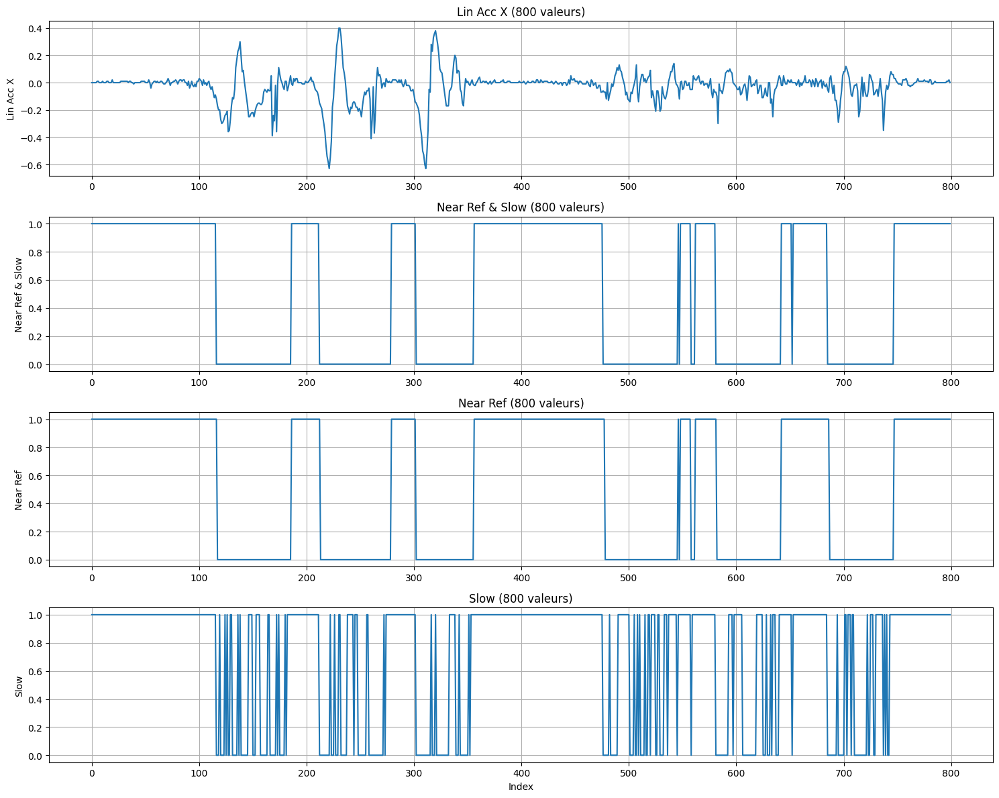

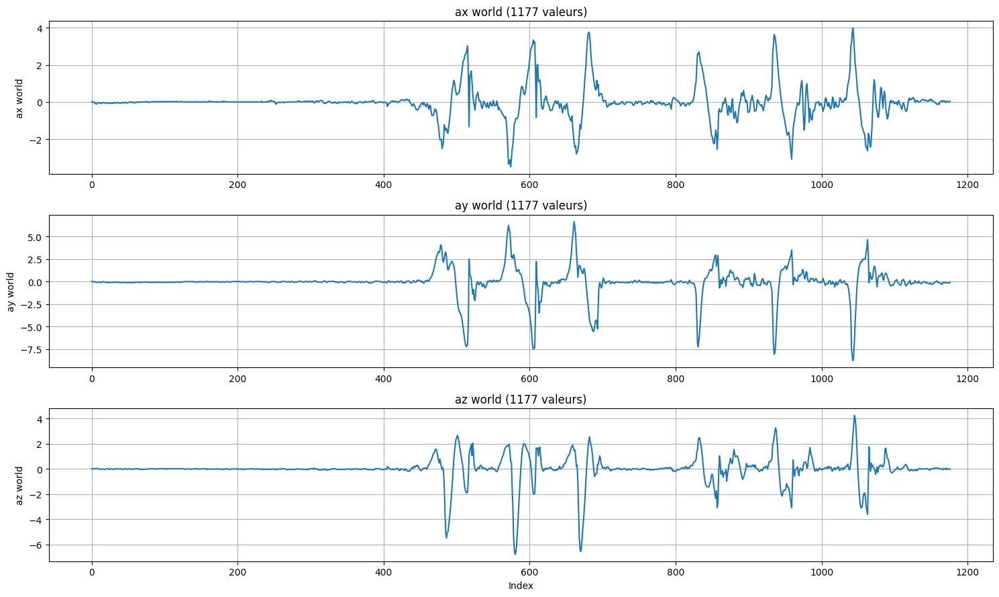

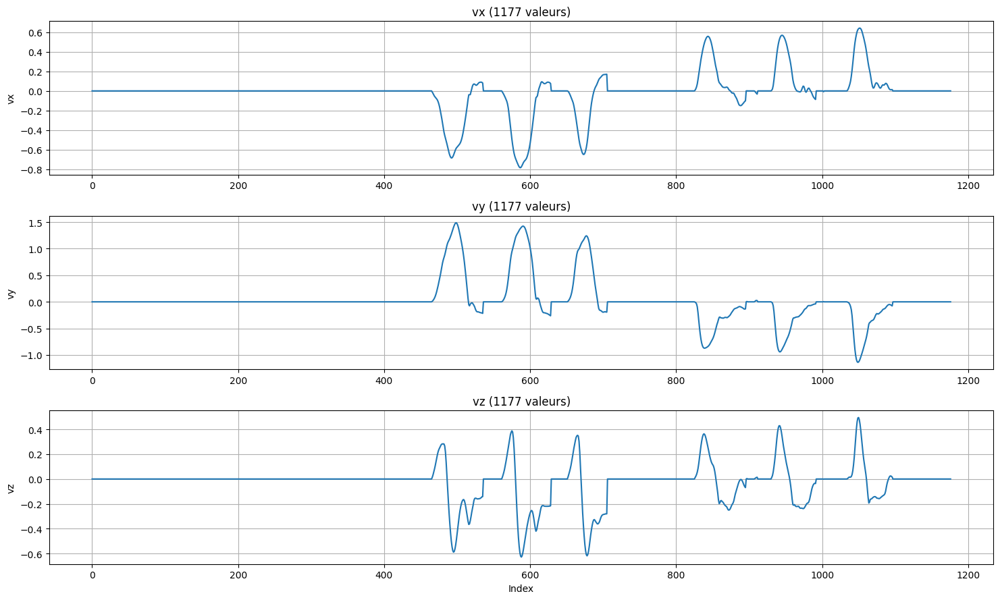

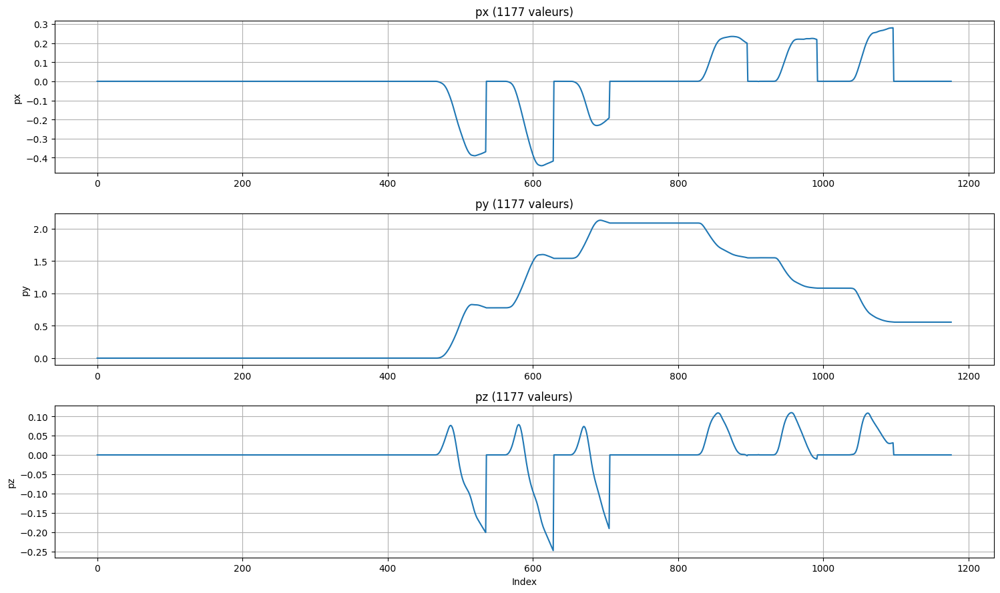

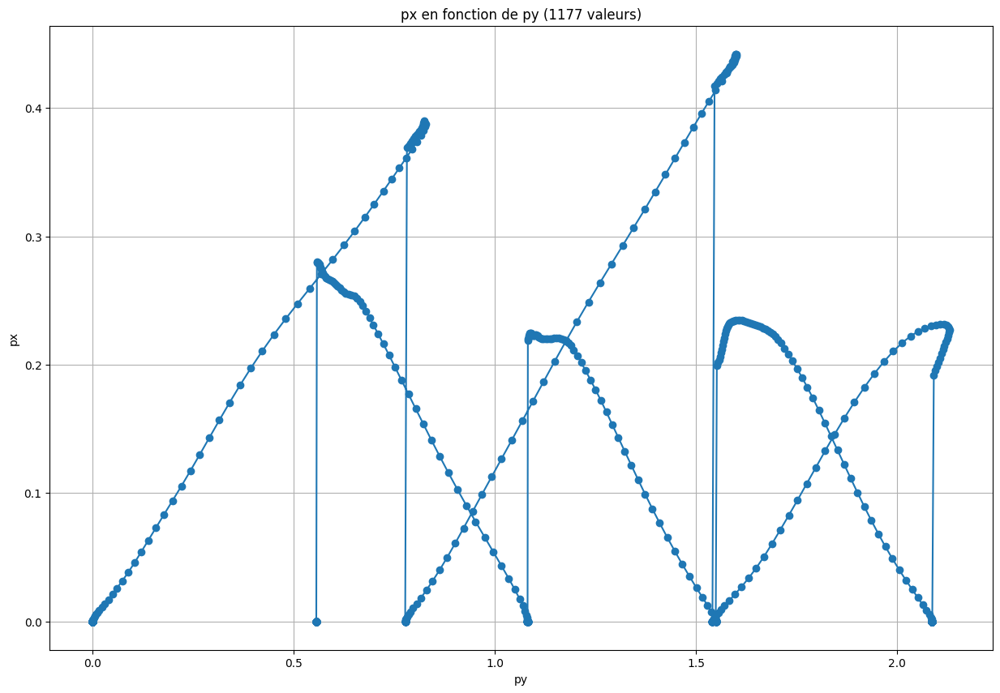

In [36]:
accMagnitudeTolerance = 0.1
derivAccMagnitudeTolerance = 1

near_ref = np.abs(ema_acc_mag) < accMagnitudeTolerance
slow = np.abs(ema_deriv) < derivAccMagnitudeTolerance

draw_data4(lin_ax, near_ref & slow, near_ref, slow, label_w='Lin Acc X', label_x='Near Ref & Slow', label_y='Near Ref', label_z='Slow', kind='plot', start=start, end=end)

px, py, pz = position_from_quat_and_acc(lin_ax, lin_ay, lin_az, qw, qx, qy, qz, delta_t, near_ref, slow)

# Reworking on datas

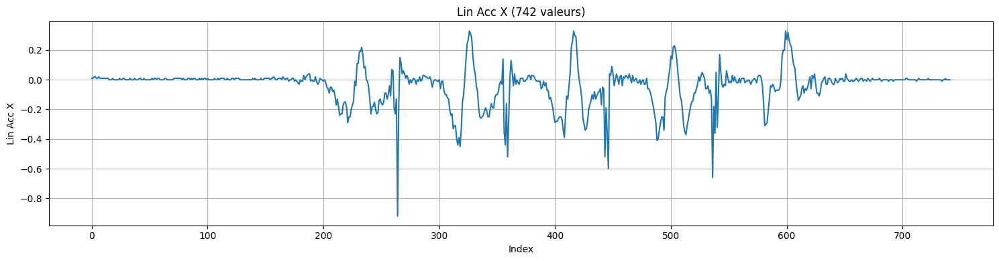

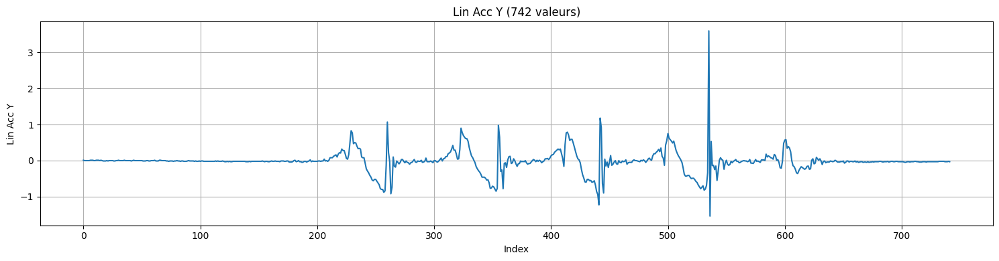

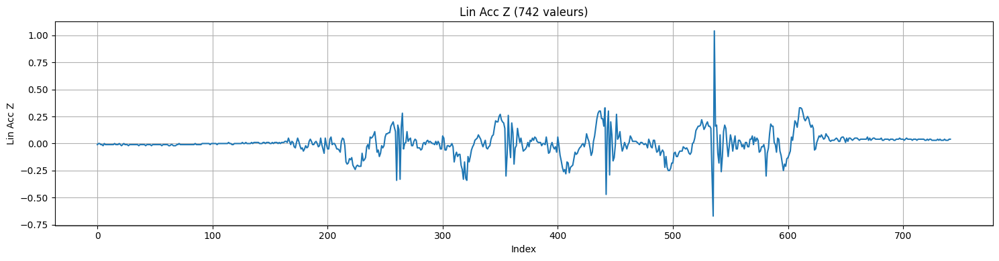

In [59]:
# chemin du fichier CSV
csv_path = "./data/data_5_steps.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

# draw data
draw_data1(lin_ax, label='Lin Acc X', kind='plot')
draw_data1(lin_ay, label='Lin Acc Y', kind='plot')
draw_data1(lin_az, label='Lin Acc Z', kind='plot')

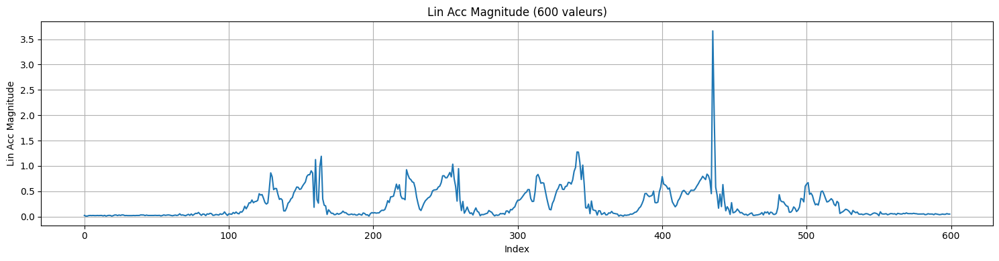

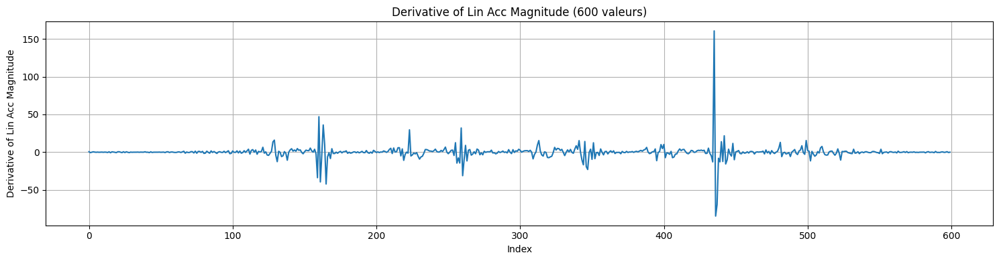

In [60]:
start = 100
end = 700

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_all_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

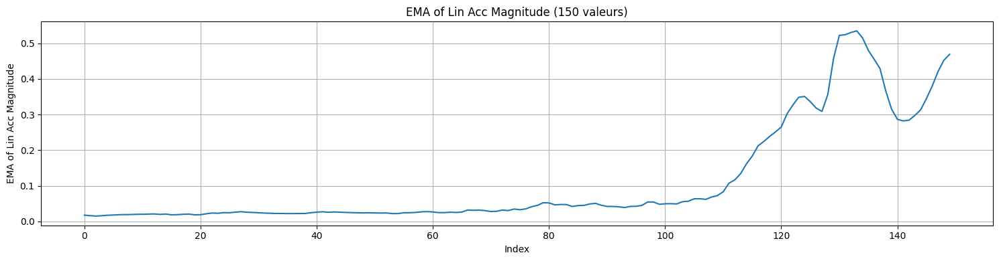

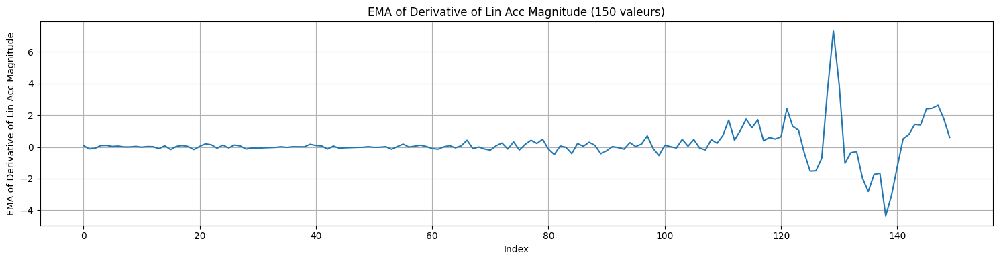

In [61]:
marge = 150

draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)

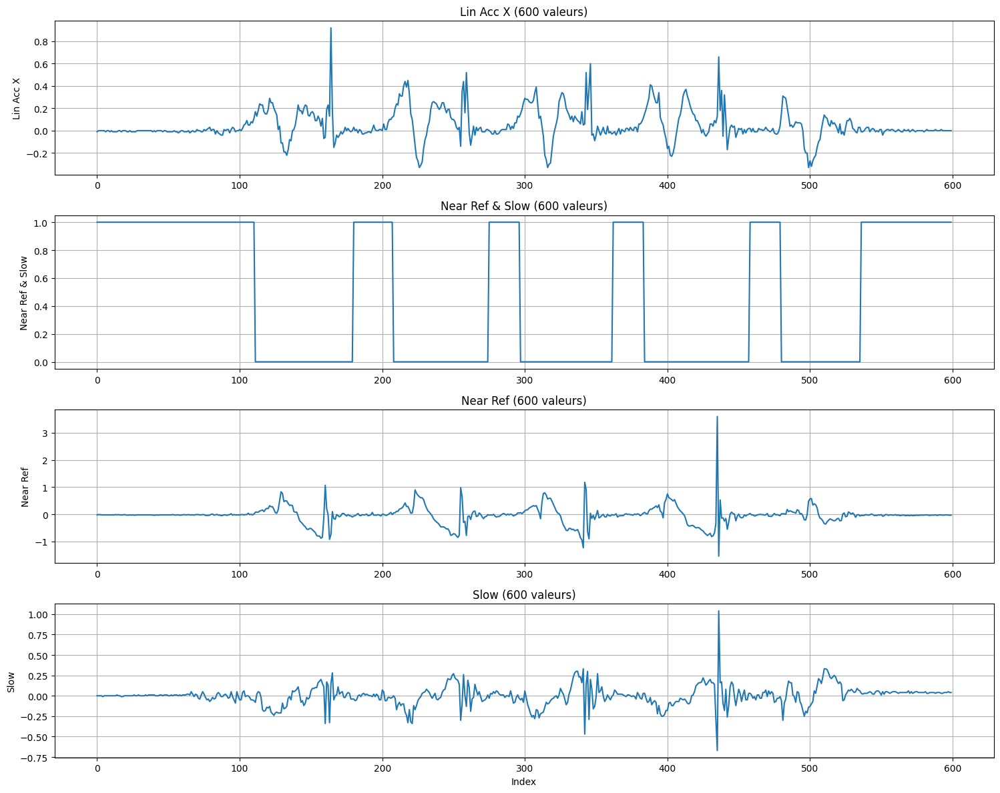

In [75]:
accMagnitudeTolerance = 0.1
derivAccMagnitudeTolerance = 1

near_ref = np.abs(ema_acc_mag) < accMagnitudeTolerance
slow = np.abs(ema_deriv) < derivAccMagnitudeTolerance

draw_data4(-lin_ax, near_ref & slow, lin_ay, lin_az, label_w='Lin Acc X', label_x='Near Ref & Slow', label_y='Near Ref', label_z='Slow', kind='plot', start=start, end=end)

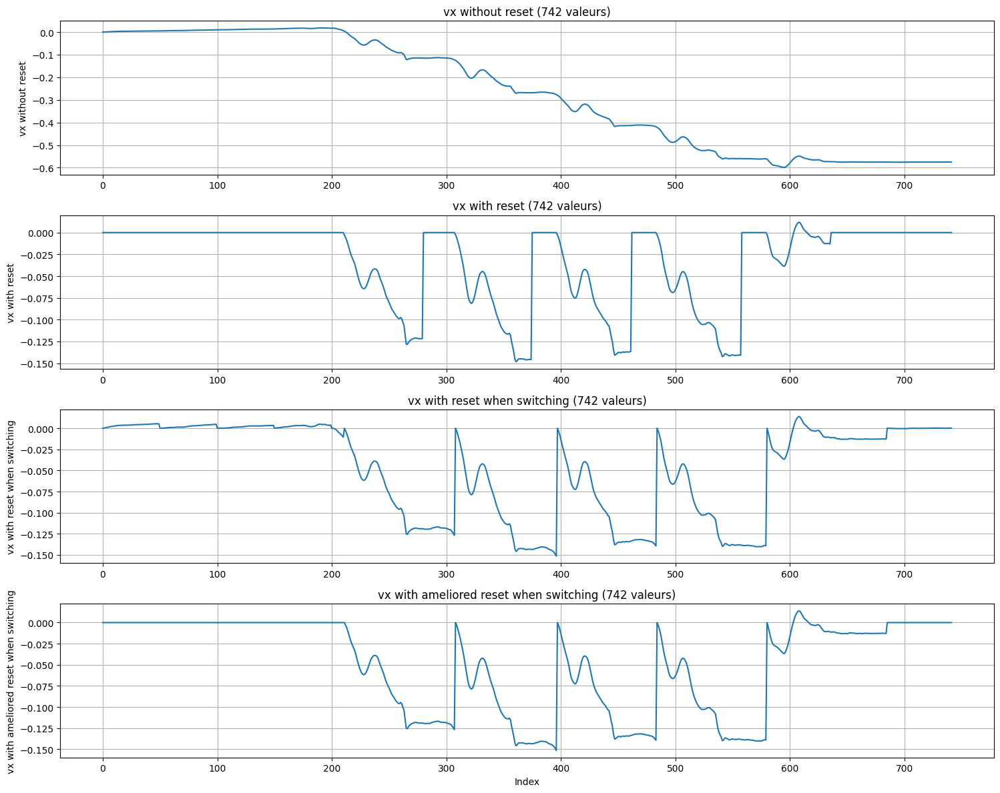

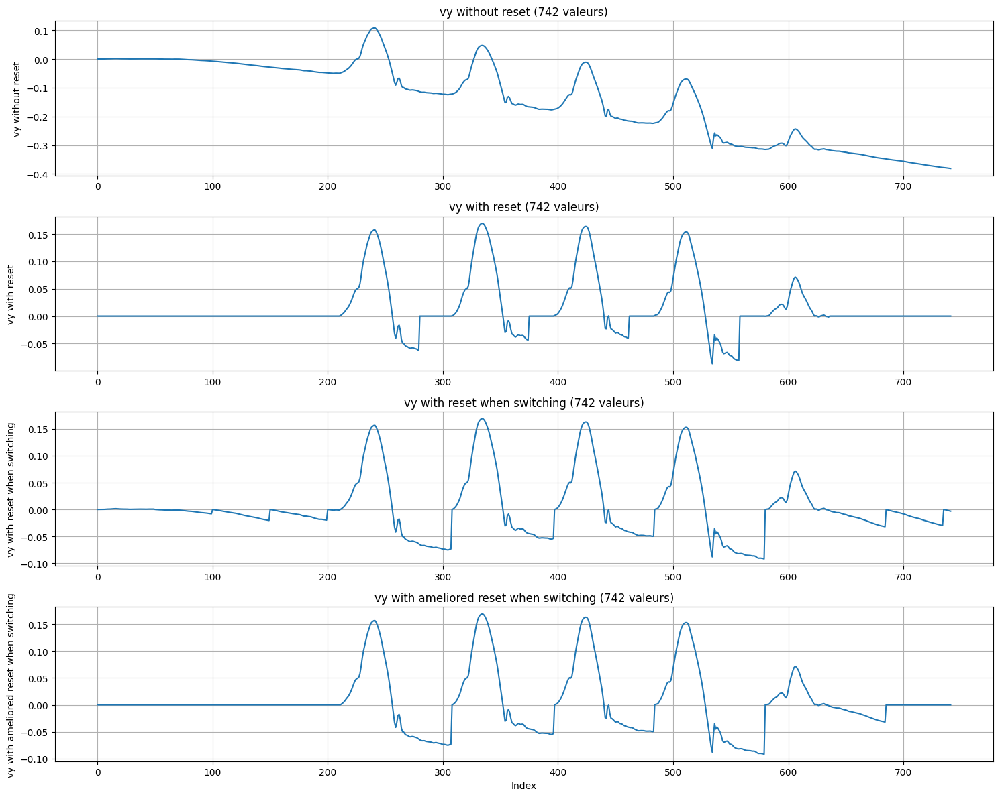

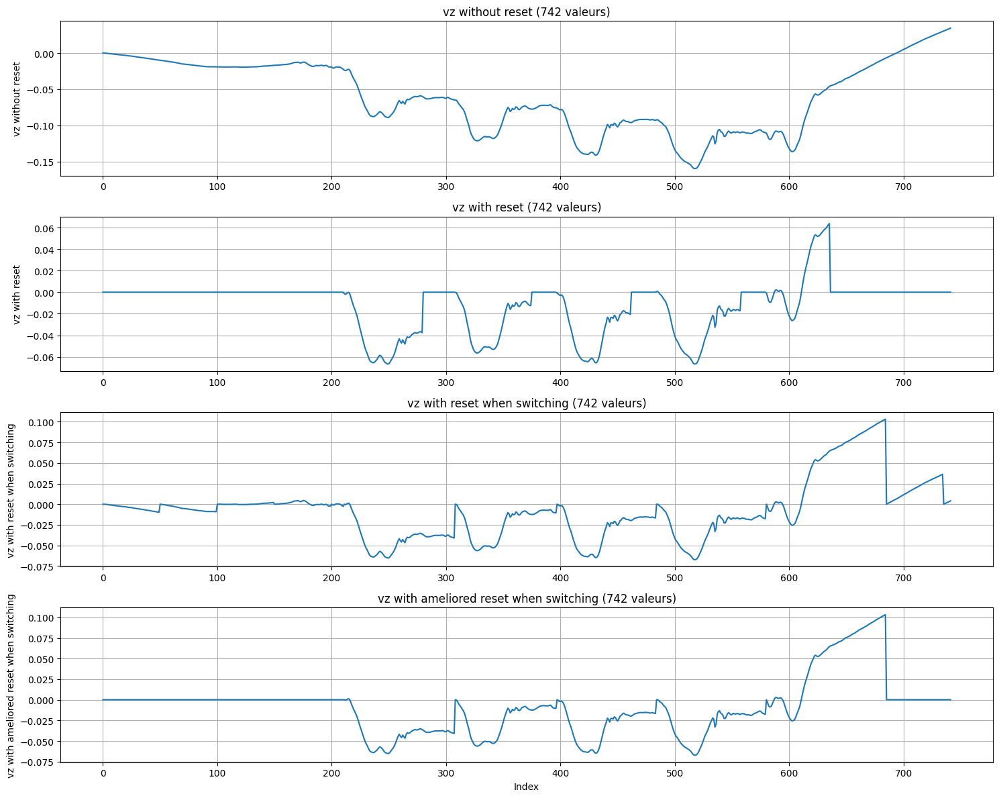

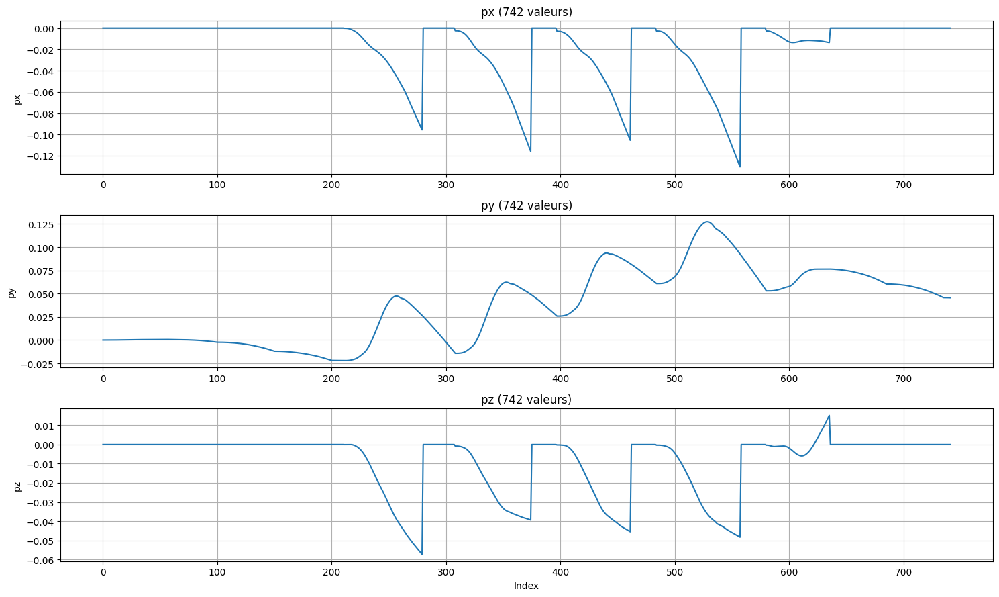

In [67]:
vx, vy, vz = trapezoidal_integration_with_reset(lin_ax, lin_ay, lin_az, delta_t, near_ref, slow).T
vx2, vy2, vz2 = trapezoidal_integration(lin_ax, lin_ay, lin_az, delta_t).T
vx3, vy3, vz3 = trapezoidal_integration_for_velocity(lin_ax, lin_ay, lin_az, delta_t, near_ref, slow).T
vx4, vy4, vz4 = trapezoidal_integration_with_switching_reset(lin_ax, lin_ay, lin_az, delta_t, near_ref, slow).T
draw_data4(vx2, vx, vx3, vx4, label_w='vx without reset', label_x='vx with reset', label_y='vx with reset when switching', label_z='vx with ameliored reset when switching')
draw_data4(vy2, vy, vy3, vy4, label_w='vy without reset', label_x='vy with reset', label_y='vy with reset when switching', label_z='vy with ameliored reset when switching')
draw_data4(vz2, vz, vz3, vz4, label_w='vz without reset', label_x='vz with reset', label_y='vz with reset when switching', label_z='vz with ameliored reset when switching')

px, py, pz = [], [], []
px, py, pz = euler_integration_with_reset(vx3, vy3, vz3, delta_t, near_ref, slow).T
draw_data3(px, py, pz, label_x='px', label_y='py', label_z='pz')

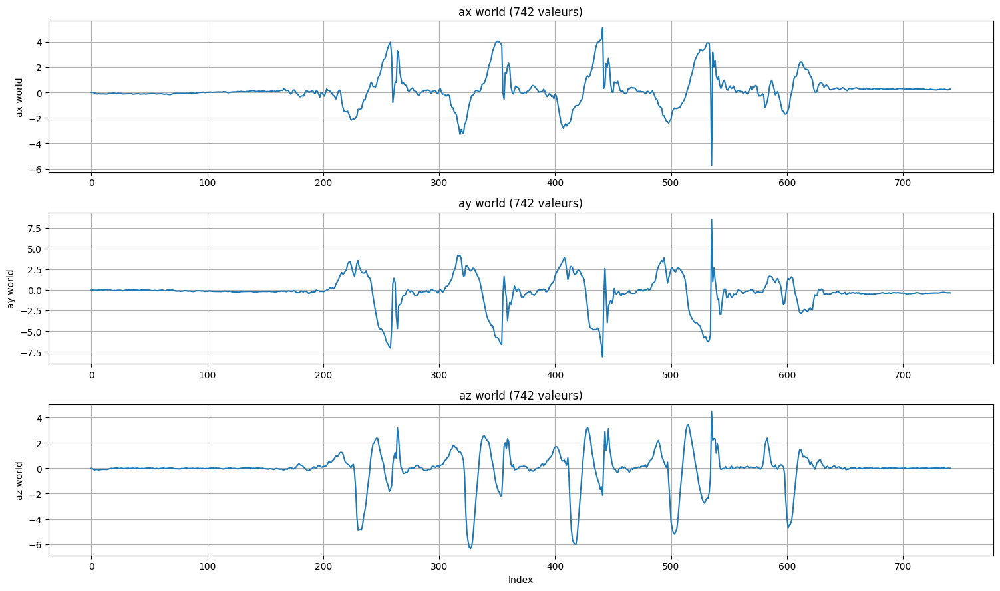

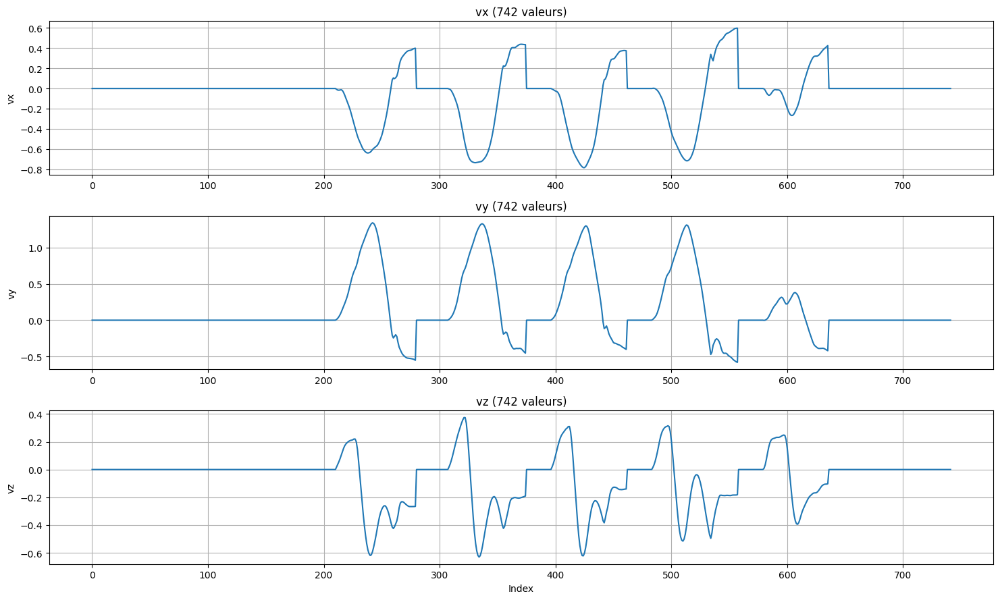

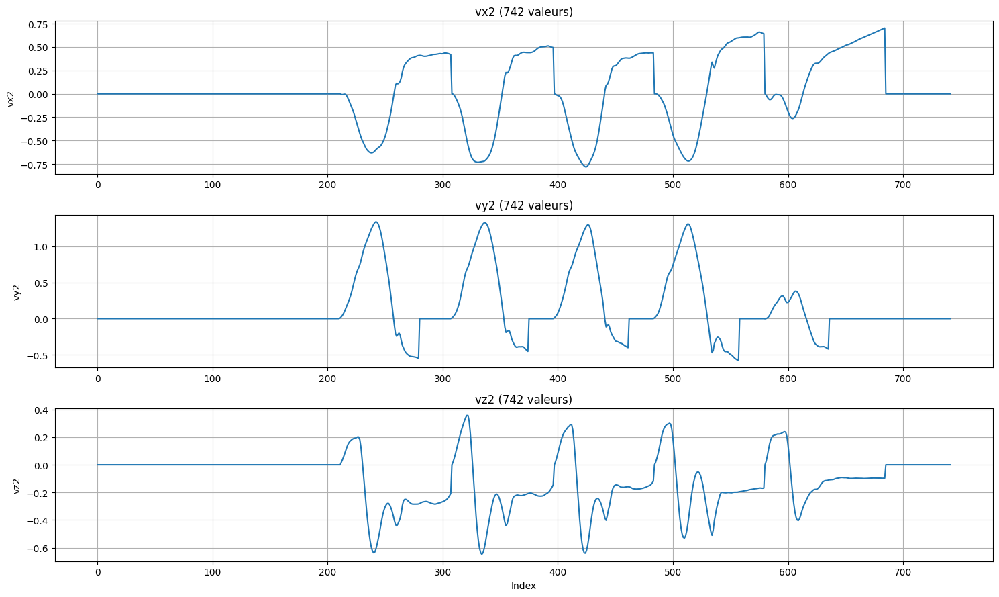

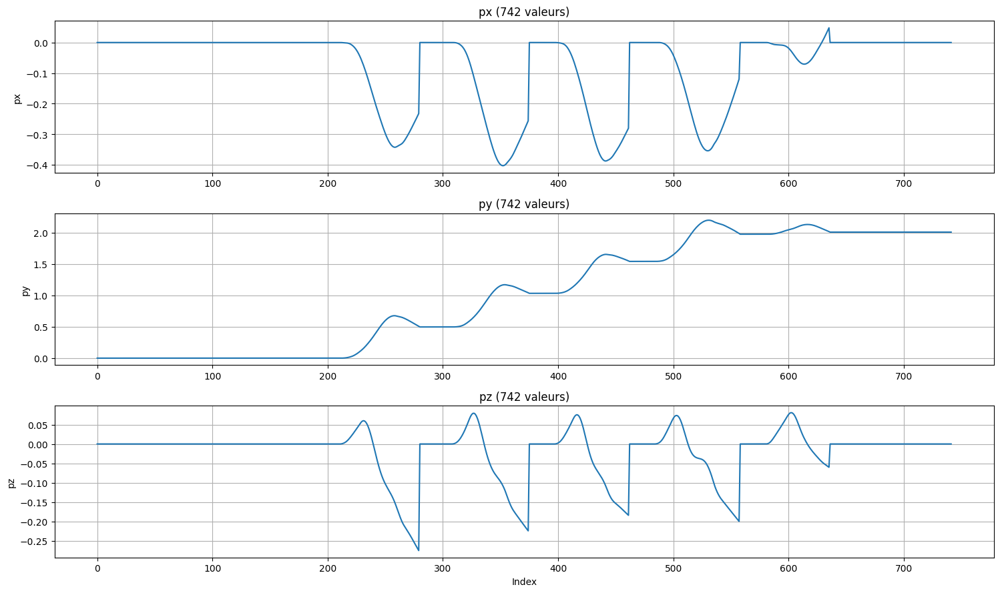

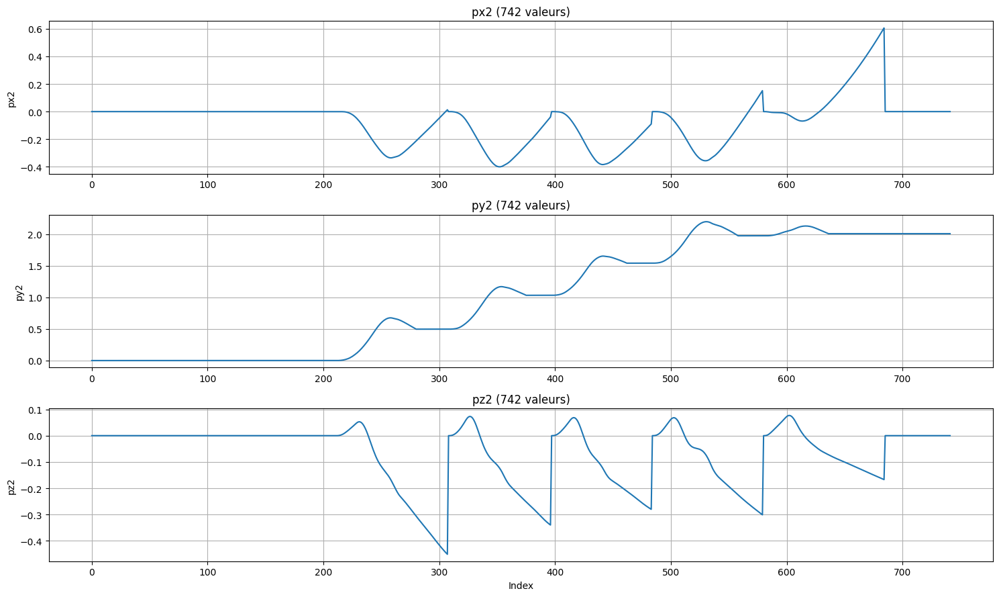

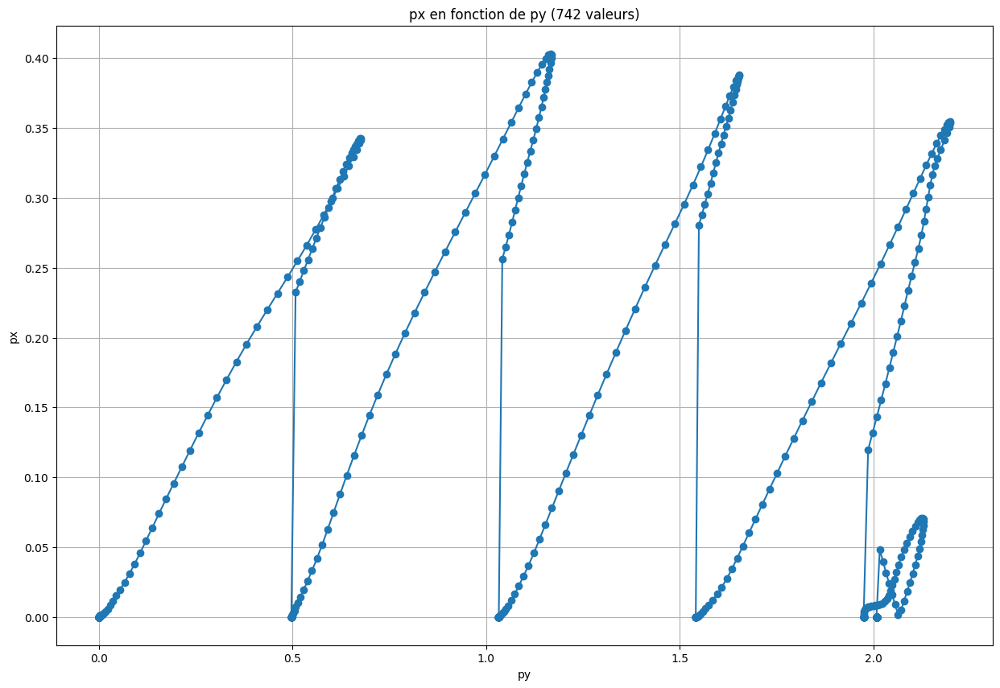

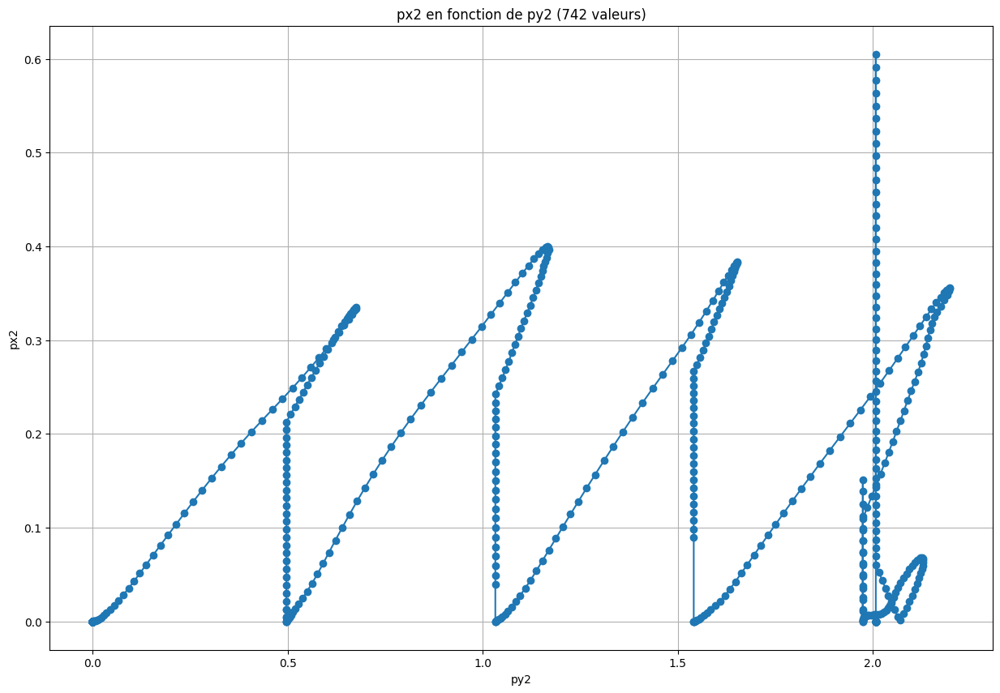

In [74]:
def position_from_quat_and_acc2(ax, ay, az, qw, qx, qy, qz, delta_t, near_ref, slow):
    
    ax_filtered, ay_filtered, az_filtered = low_pass_filter(ax, ay, az, alpha=0.4) 

    ax_world, ay_world, az_world = cal_acc_world_quat_multo(ax_filtered, ay_filtered, az_filtered, qw, qx, qy, qz)

    # passé de g à m/s²
    ax_world, ay_world, az_world = ax_world * 9.81, ay_world * 9.81, az_world * 9.81

    vx, vy, vz = trapezoidal_integration_with_reset(ax_world, ay_world, az_world, delta_t, near_ref, slow).T
    vx2, vy2, vz2 = trapezoidal_integration_with_switching_reset2(ax_world, ay_world, az_world, delta_t, near_ref, slow).T

    px, py, pz = euler_integration_with_reset(vx, vy, vz, delta_t, near_ref, slow).T
    px2, py2, pz2 = euler_integration_with_switching_reset(vx2, vy2, vz2, delta_t, near_ref, slow).T

    draw_data3(ax_world, ay_world, az_world, label_x='ax world', label_y='ay world', label_z='az world')
    draw_data3(vx, vy, vz, label_x='vx', label_y='vy', label_z='vz')
    draw_data3(vx2, vy2, vz2, label_x='vx2', label_y='vy2', label_z='vz2')
    draw_data3(px, py, pz, label_x='px', label_y='py', label_z='pz')
    draw_data3(px2, py2, pz2, label_x='px2', label_y='py2', label_z='pz2')
    compare_data(py, np.abs(px), xlabel='py', ylabel='px', kind='plot')
    compare_data(py2, np.abs(px2), xlabel='py2', ylabel='px2', kind='plot')

    return px, py, pz

px, py, pz = [], [], []
px, py, pz = position_from_quat_and_acc2(lin_ax, lin_ay, lin_az, qw, qx, qy, qz, delta_t, near_ref, slow)

In [43]:
# rendre precis et dimunier les resset de vitesse ne fait qu'engraver la situation

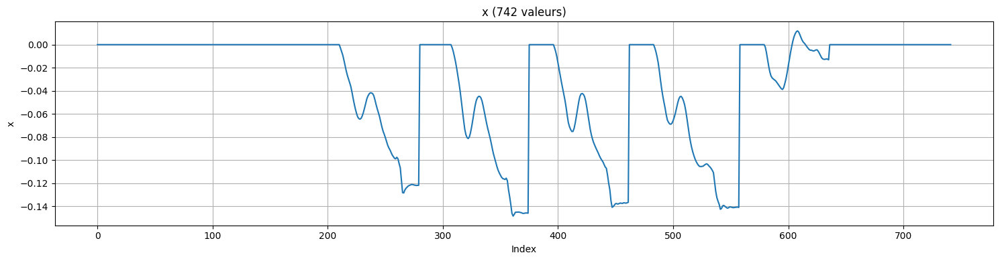

In [44]:
t = np.cumsum(delta_t)
draw_data1(vx)

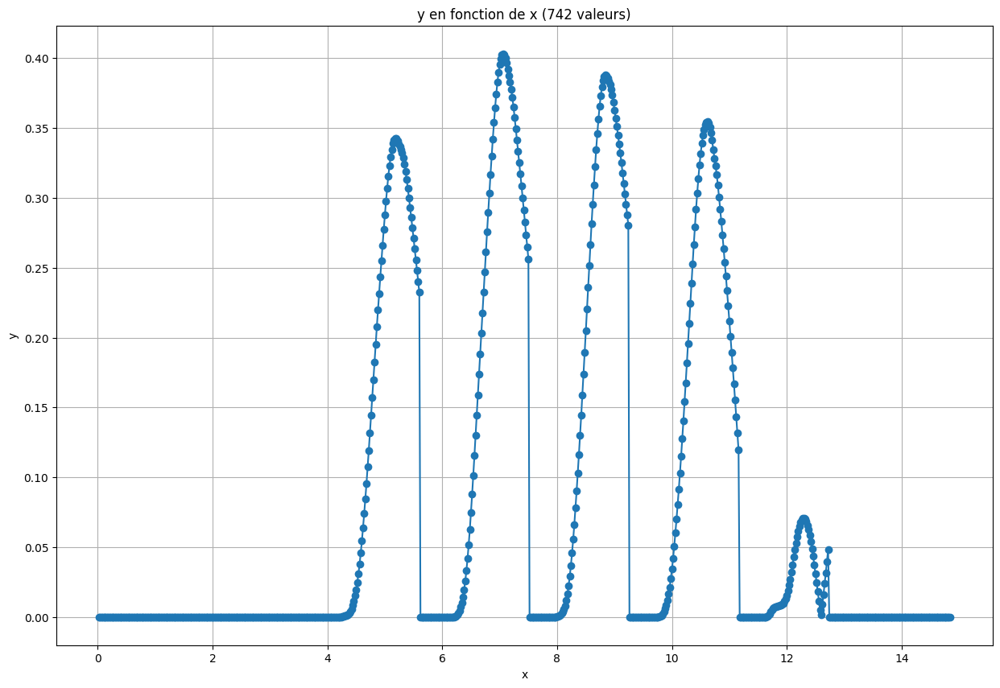

In [45]:
compare_data(t, np.abs(px))

# square 

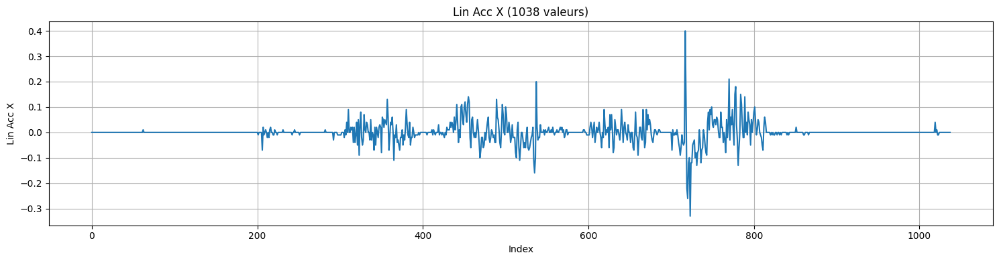

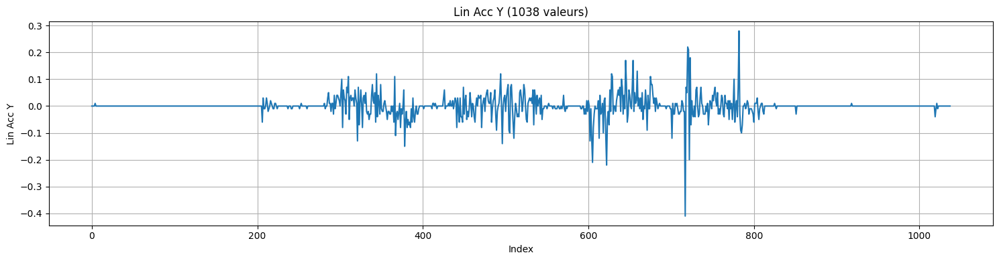

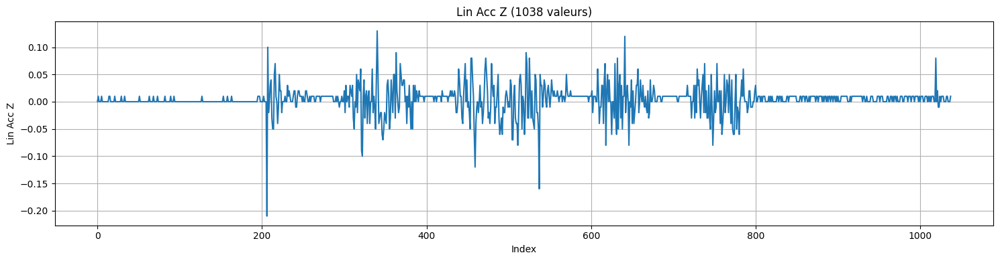

In [46]:
# chemin du fichier CSV
csv_path = "./data/data_square.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

# draw data
draw_data1(lin_ax, label='Lin Acc X', kind='plot')
draw_data1(lin_ay, label='Lin Acc Y', kind='plot')
draw_data1(lin_az, label='Lin Acc Z', kind='plot')

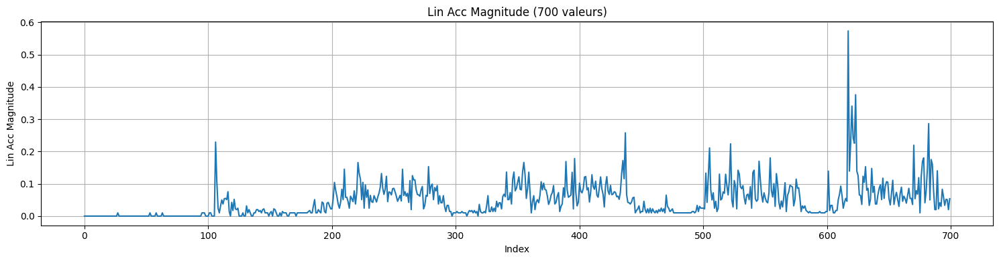

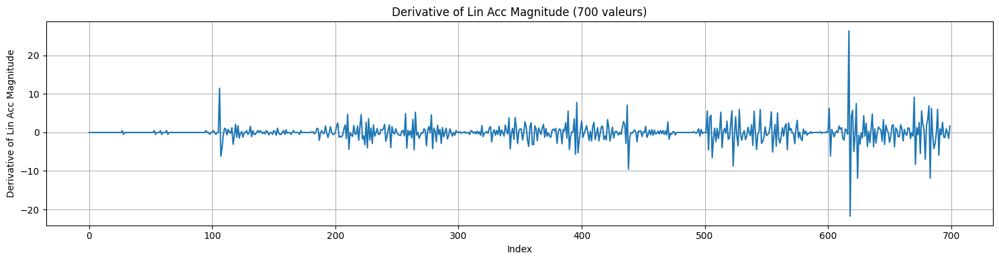

In [47]:
start = 100
end = 800

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_all_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

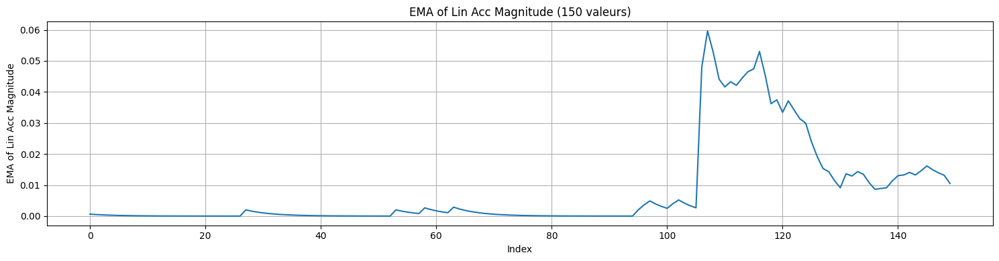

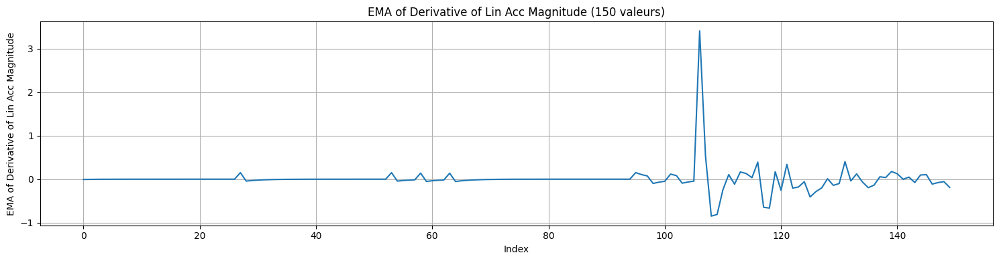

In [48]:
marge = 150

draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)

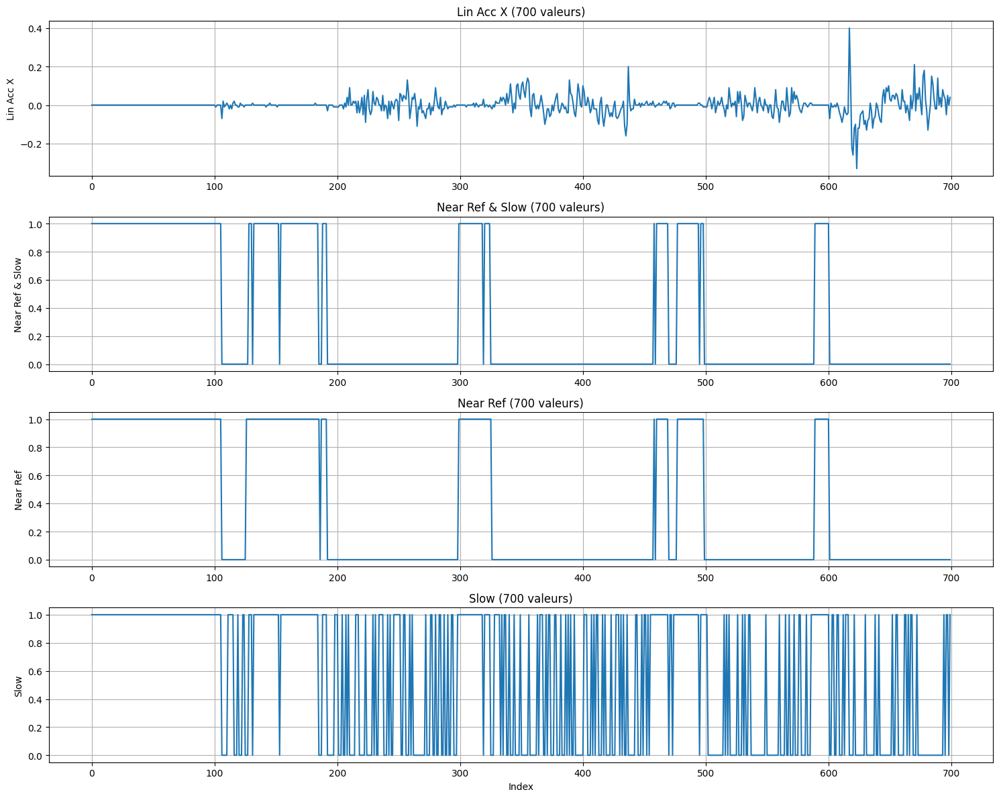

In [49]:
accMagnitudeTolerance = 0.02
derivAccMagnitudeTolerance = 0.2

near_ref = np.abs(ema_acc_mag) < accMagnitudeTolerance
slow = np.abs(ema_deriv) < derivAccMagnitudeTolerance

draw_data4(lin_ax, near_ref & slow, near_ref, slow, label_w='Lin Acc X', label_x='Near Ref & Slow', label_y='Near Ref', label_z='Slow', kind='plot', start=start, end=end)

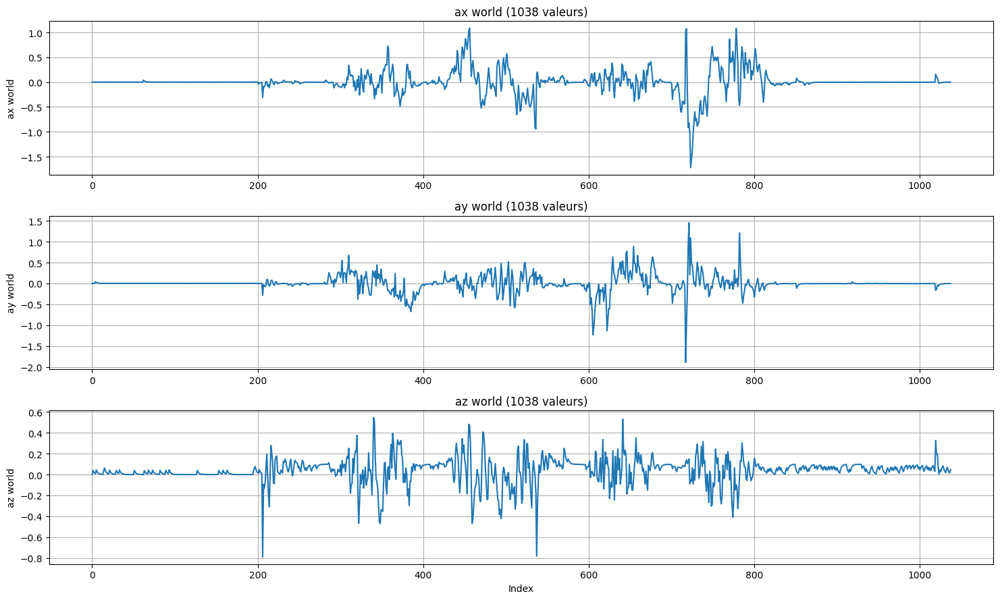

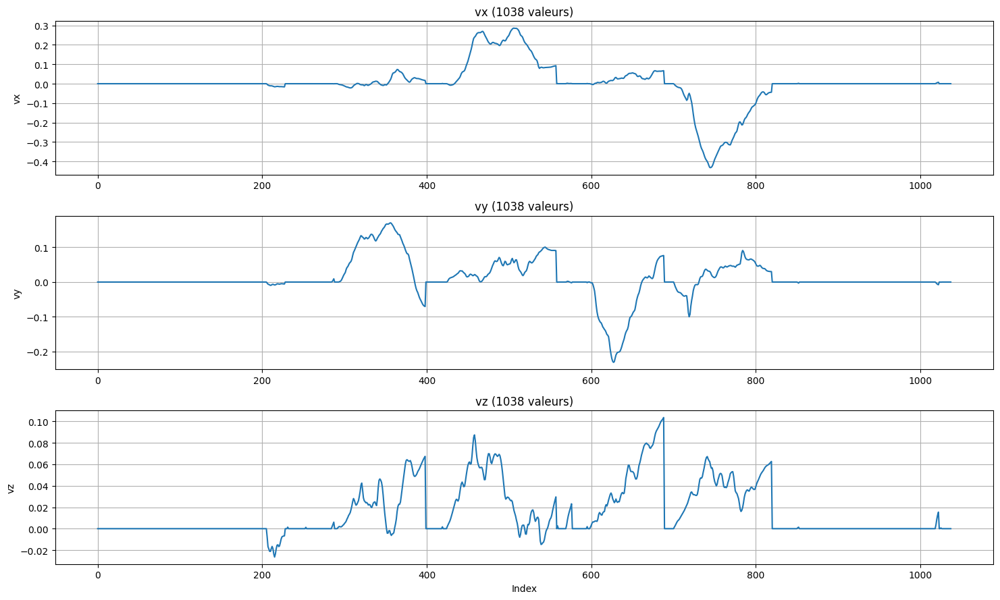

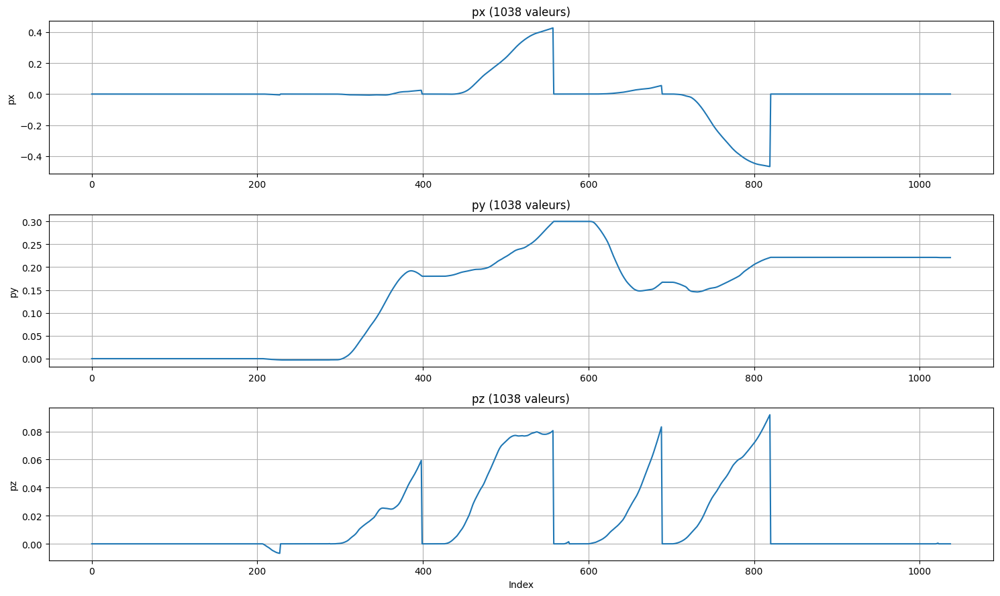

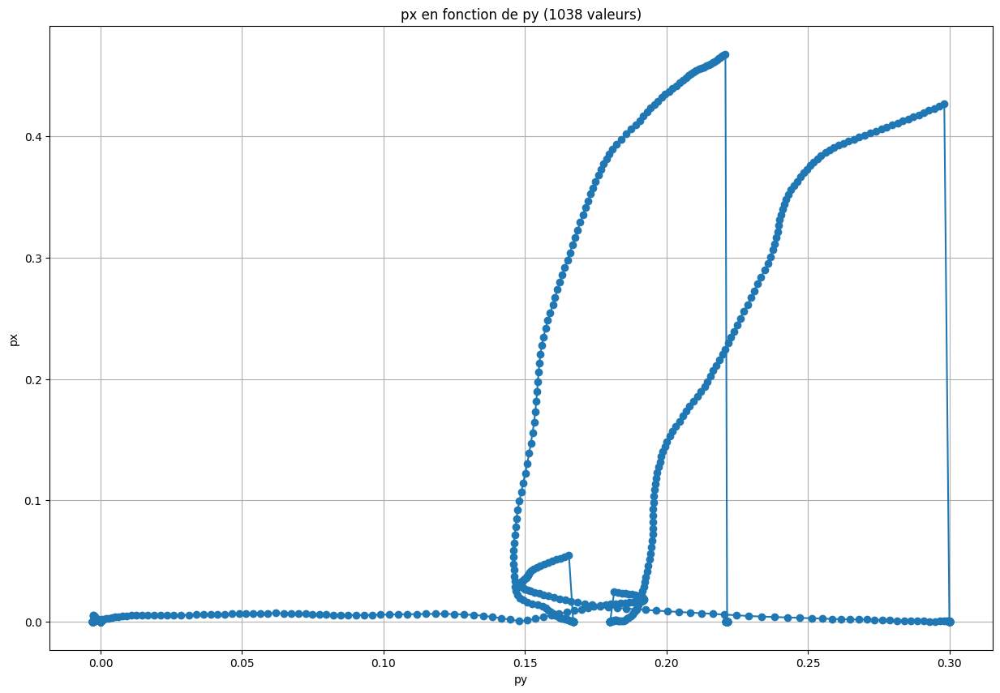

(array([0., 0., 0., ..., 0., 0., 0.]),
 array([0.        , 0.        , 0.        , ..., 0.22087693, 0.22087693,
        0.22087693]),
 array([0., 0., 0., ..., 0., 0., 0.]))

In [50]:
position_from_quat_and_acc(lin_ax, lin_ay, lin_az, qw, qx, qy, qz, delta_t, near_ref, slow)

# utiliser la matrice de Rot quaternion

In [51]:
def cal_acc_world_rot_i(axi, ayi, azi, qwi, qxi, qyi, qzi):

    # vecteur [ax, ay, az]
  a = np.array([axi, ayi, azi])

  # matrice de rotation R
  R = np.array([
      [2*qwi**2 - 1 + 2*qxi**2,     2*(qxi*qyi + qwi*qzi),     2*(qxi*qzi - qwi*qyi)],
      [2*(qxi*qyi - qwi*qzi),         2*qwi**2 - 1 + 2*qyi**2, 2*(qyi*qzi + qwi*qxi)],
      [2*(qxi*qzi + qwi*qyi),         2*(qyi*qzi - qwi*qxi),     2*qwi**2 - 1 + 2*qzi**2]
  ])

  return R.dot(a)

def cal_acc_world_rot_matrix(ax, ay, az, quatw, quatx, quaty, quatz):
    N = len(ax)
    ax_world = np.zeros(N)
    ay_world = np.zeros(N)
    az_world = np.zeros(N)
    
    for i in range(1, N):
        ax_world[i], ay_world[i], az_world[i] = cal_acc_world_rot_i(ax[i], ay[i], az[i], qw[i], qx[i], qy[i], qz[i])

    return ax_world, ay_world, az_world


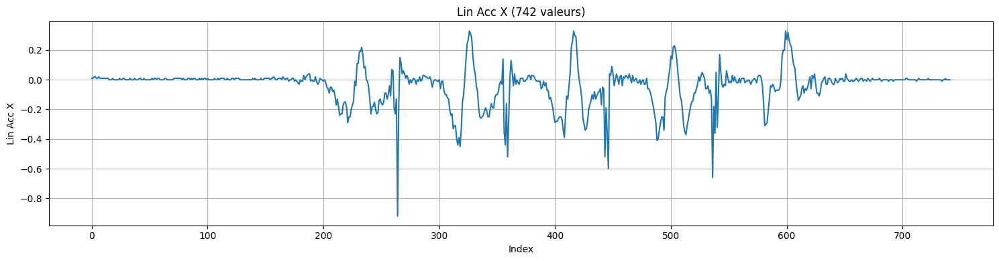

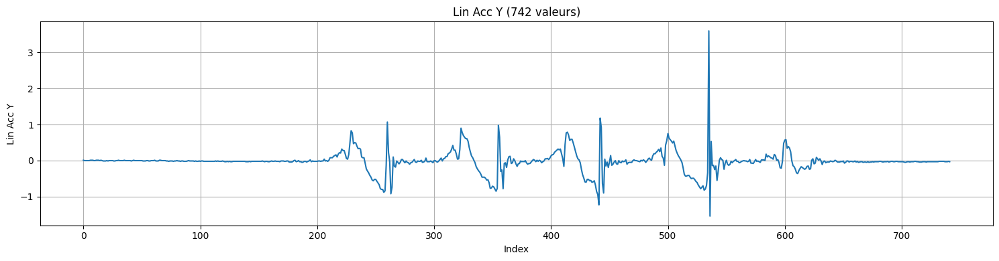

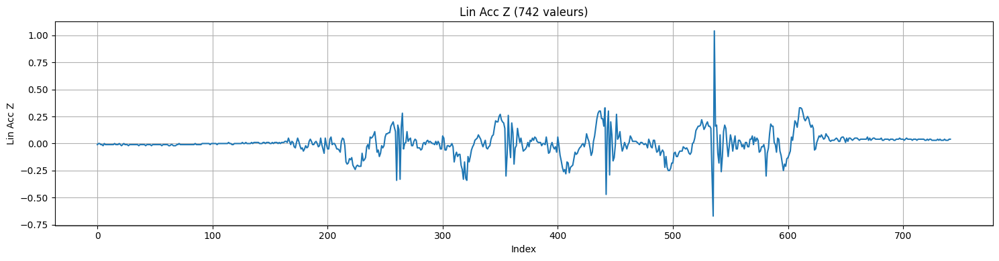

In [52]:
# chemin du fichier CSV
csv_path = "./data/data_5_steps.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

# draw data
draw_data1(lin_ax, label='Lin Acc X', kind='plot')
draw_data1(lin_ay, label='Lin Acc Y', kind='plot')
draw_data1(lin_az, label='Lin Acc Z', kind='plot')

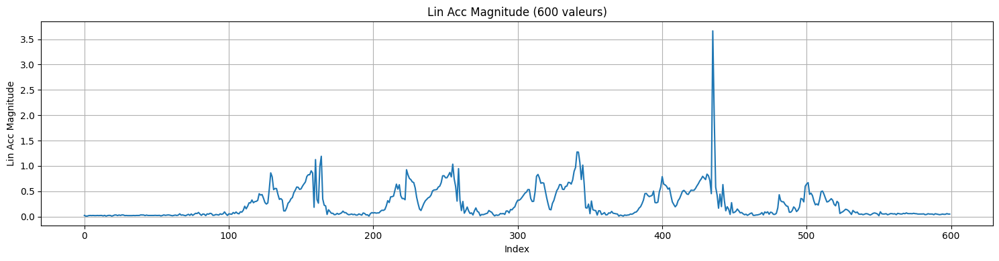

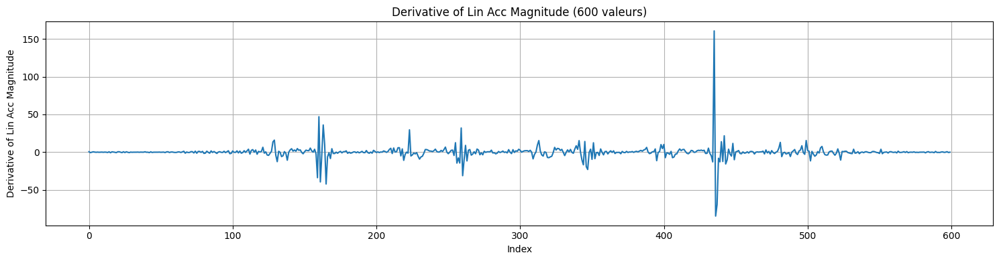

In [53]:
start = 100
end = 700

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_all_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

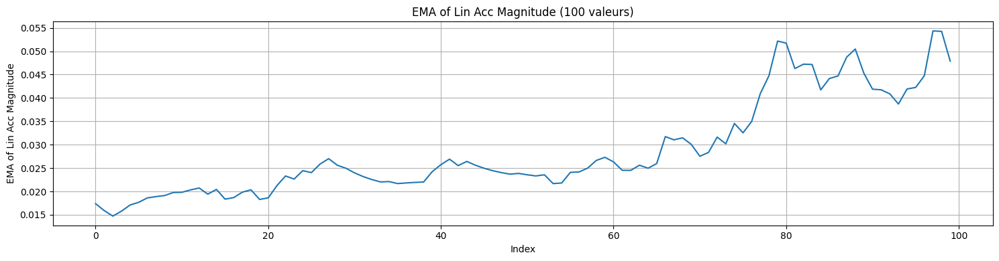

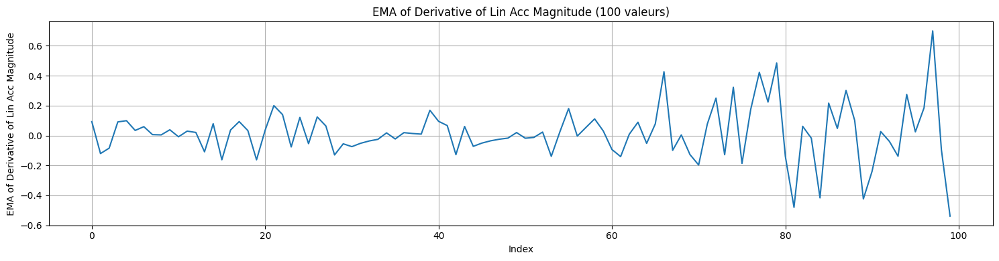

In [54]:
marge = 100

draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)

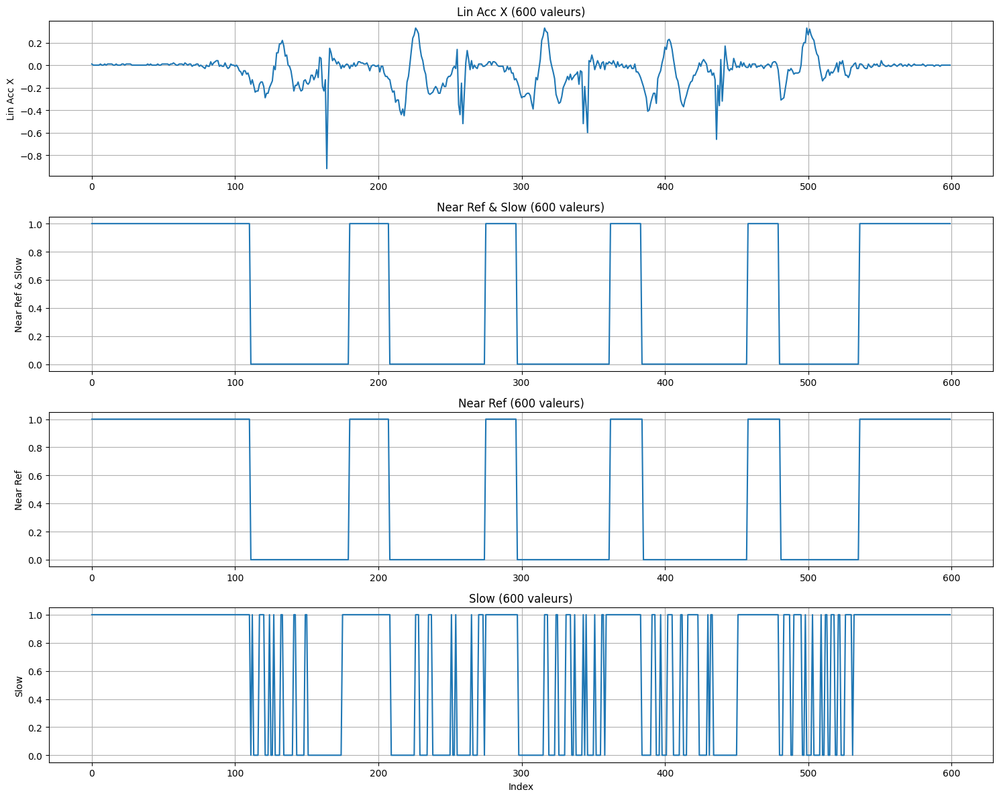

In [55]:
accMagnitudeTolerance = 0.1
derivAccMagnitudeTolerance = 1

near_ref = np.abs(ema_acc_mag) < accMagnitudeTolerance
slow = np.abs(ema_deriv) < derivAccMagnitudeTolerance

draw_data4(lin_ax, near_ref & slow, near_ref, slow, label_w='Lin Acc X', label_x='Near Ref & Slow', label_y='Near Ref', label_z='Slow', kind='plot', start=start, end=end)

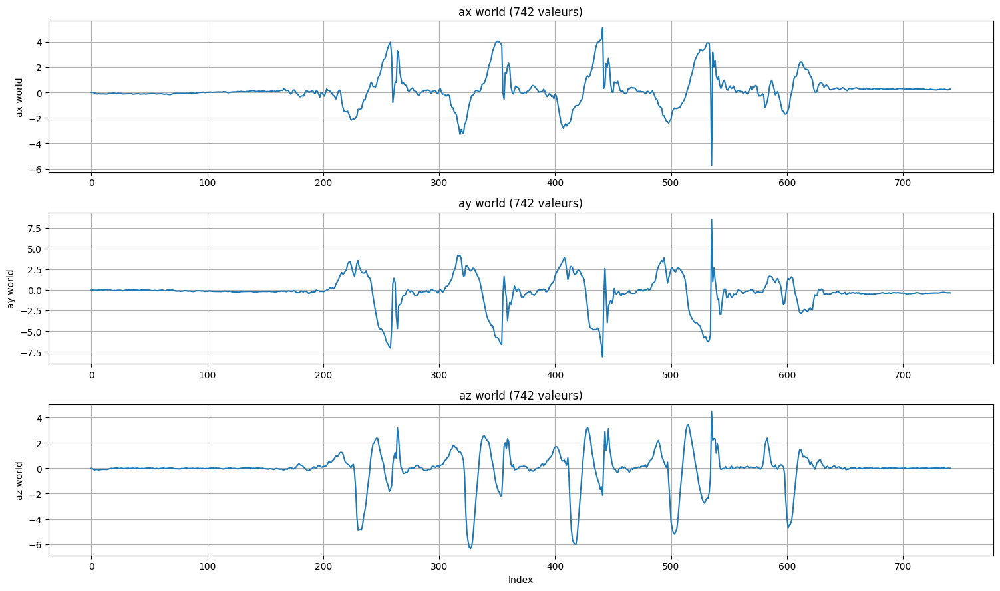

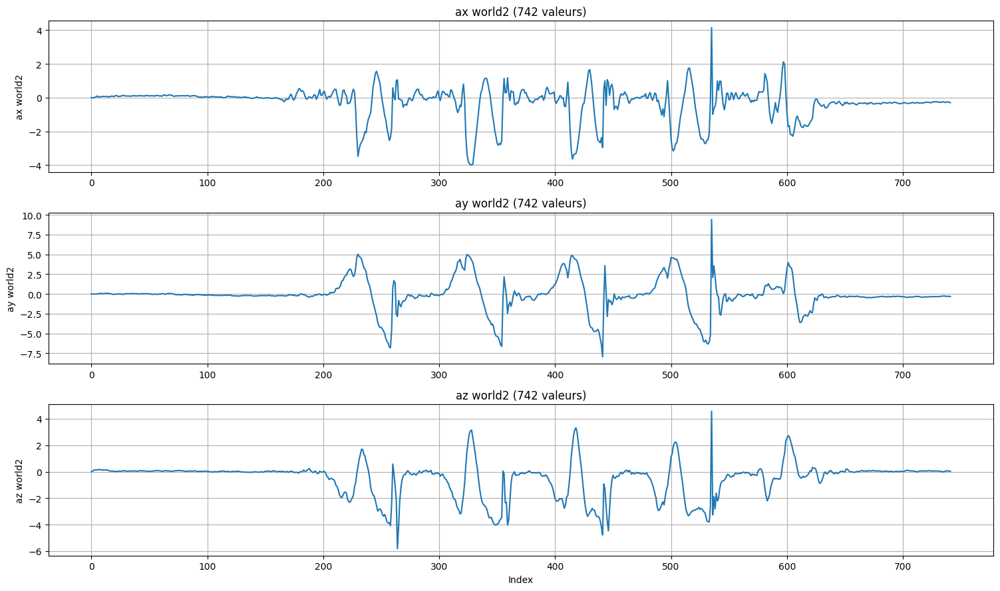

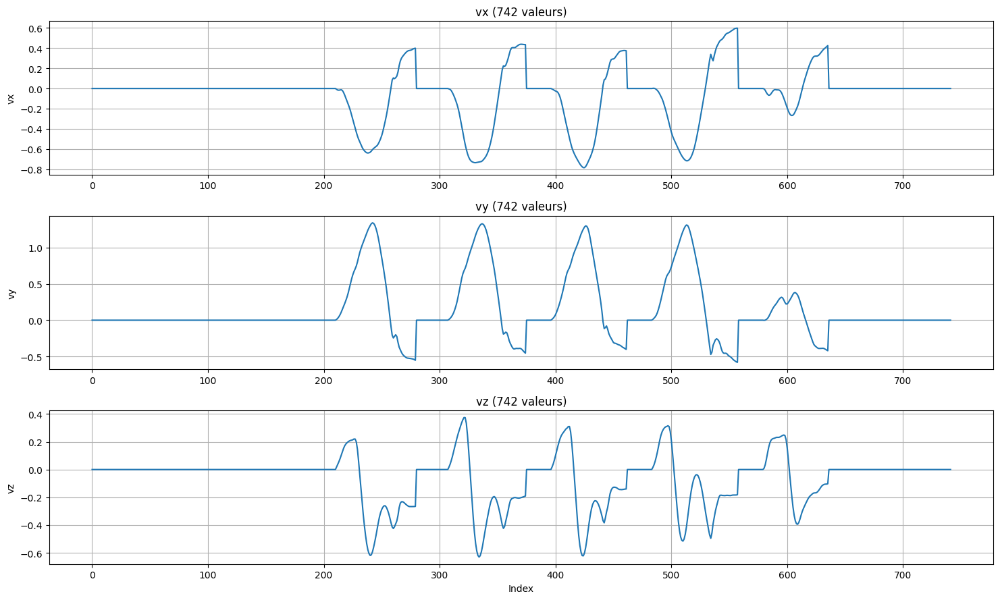

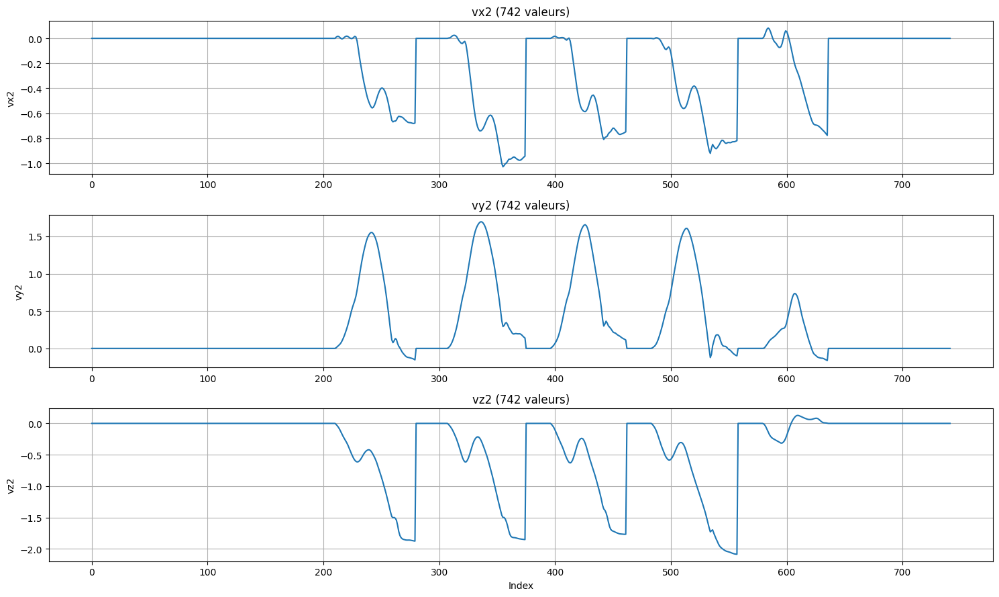

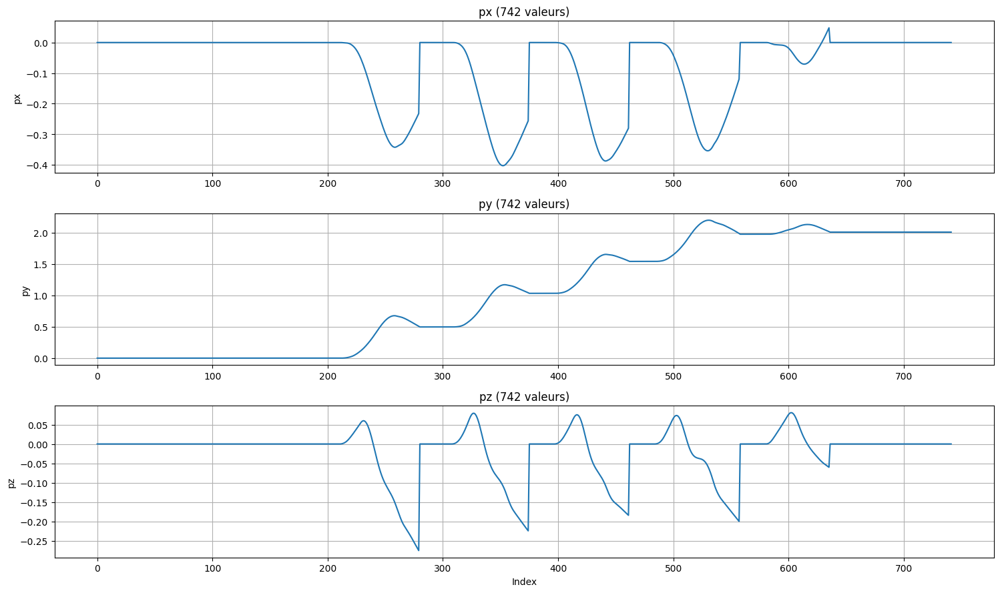

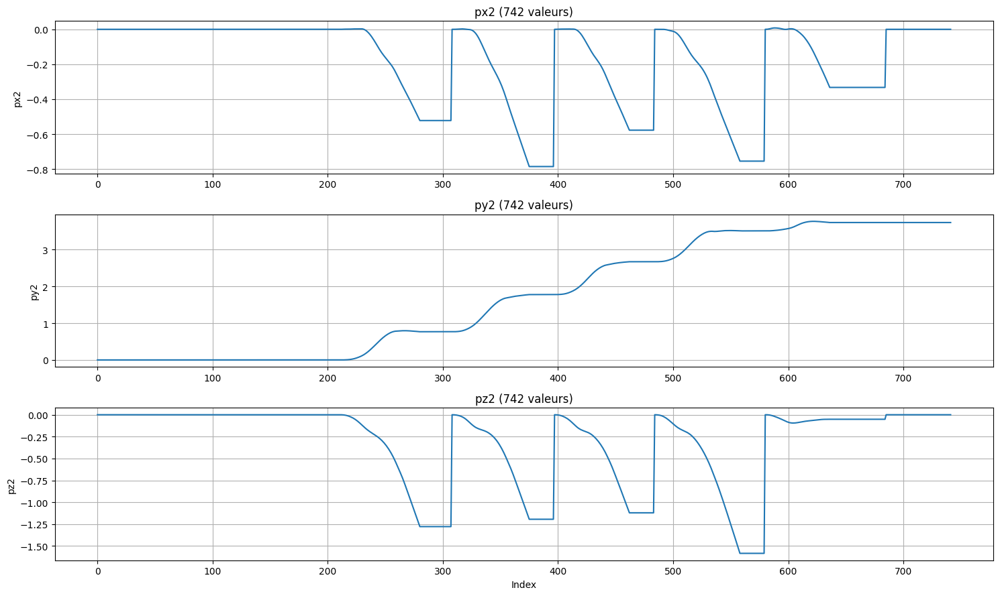

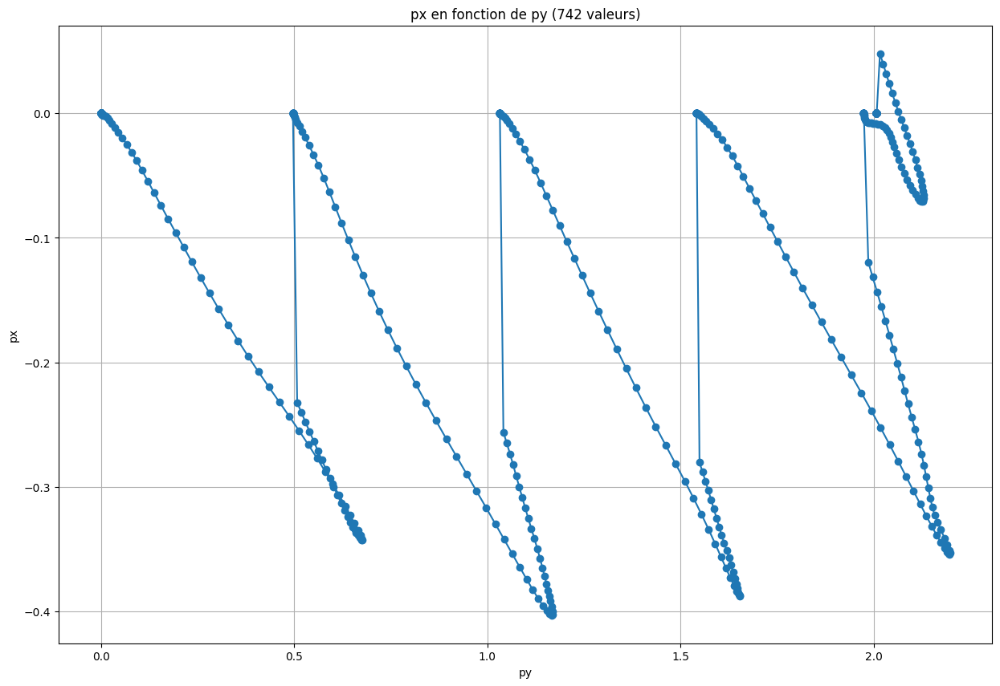

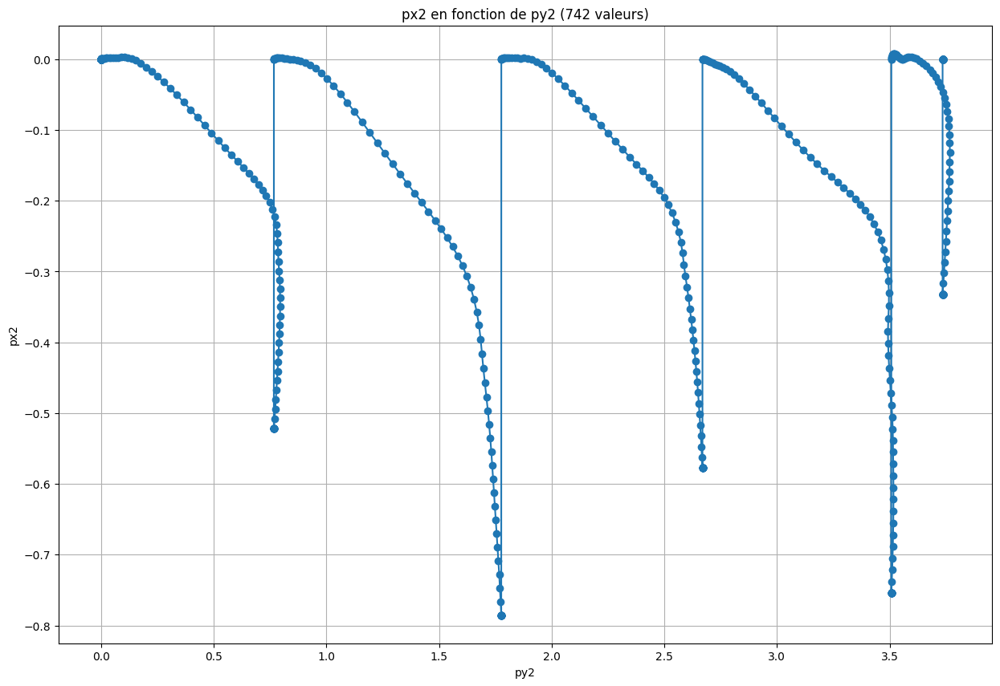

In [56]:
def position_from_quat_and_acc3(ax, ay, az, qw, qx, qy, qz, delta_t, near_ref, slow):
    
    ax_filtered, ay_filtered, az_filtered = low_pass_filter(ax, ay, az, alpha=0.4) 
    ax_world, ay_world, az_world = cal_acc_world_quat_multo(ax_filtered, ay_filtered, az_filtered, qw, qx, qy, qz)
    ax_world2, ay_world2, az_world2 = cal_acc_world_rot_matrix(ax_filtered, ay_filtered, az_filtered, qw, qx, qy, qz)

    # passé de g à m/s²
    ax_world, ay_world, az_world = ax_world * 9.81, ay_world * 9.81, az_world * 9.81
    ax_world2, ay_world2, az_world2 = ax_world2 * 9.81, ay_world2 * 9.81, az_world2 * 9.81

    vx, vy, vz = [], [], []
    vx2, vy2, vz2 = [], [], []
    vx, vy, vz = trapezoidal_integration_with_reset(ax_world, ay_world, az_world, delta_t, near_ref, slow).T
    vx2, vy2, vz2 = trapezoidal_integration_with_reset(ax_world2, ay_world2, az_world2, delta_t, near_ref, slow).T

    px, py, pz = [], [], []
    px2, py2, pz2 = [], [], []
    px, py, pz = euler_integration_with_reset(vx, vy, vz, delta_t, near_ref, slow).T
    px2, py2, pz2 = euler_integration_for_pos(vx2, vy2, vz2, delta_t, near_ref, slow).T

    draw_data3(ax_world, ay_world, az_world, label_x='ax world', label_y='ay world', label_z='az world')
    draw_data3(ax_world2, ay_world2, az_world2, label_x='ax world2', label_y='ay world2', label_z='az world2')
    draw_data3(vx, vy, vz, label_x='vx', label_y='vy', label_z='vz')
    draw_data3(vx2, vy2, vz2, label_x='vx2', label_y='vy2', label_z='vz2')
    draw_data3(px, py, pz, label_x='px', label_y='py', label_z='pz')
    draw_data3(px2, py2, pz2, label_x='px2', label_y='py2', label_z='pz2')
    compare_data(py, px, xlabel='py', ylabel='px', kind='plot')
    compare_data(py2, px2, xlabel='py2', ylabel='px2', kind='plot')

    return px, py, pz

px, py, pz = position_from_quat_and_acc3(lin_ax, lin_ay, lin_az, qw, qx, qy, qz, delta_t, near_ref, slow)

# avec des filtres aussi

# fin
